In [1]:
import numpy as np
import copy
from astropy.io import fits
from importlib import reload
import matplotlib.pyplot as plt
plt.rcParams['image.origin']='lower'
import os
from pathlib import Path
from datetime import datetime
date = int(datetime.today().strftime('%Y%m%d'))

import proper
proper.use_ffti = False
proper.use_fftw = False

import roman_phasec_proper as phasec
phasec.copy_here()
import falco

from IPython.display import clear_output, display, HTML
display(HTML("<style>.container { width:90% !important; }</style>")) # just making the notebook cells wider

falco_dir = Path(os.path.dirname(falco.__file__))
roman_dir = Path(os.path.dirname(falco_dir))/'roman'
flatmap_dir = roman_dir/'flatmaps'

import misc
from imshows import *

import falco_hlc_575_mp
import phase_retrieval as pr

/home/u21/kianmilani/Documents/falco-python/falco/config


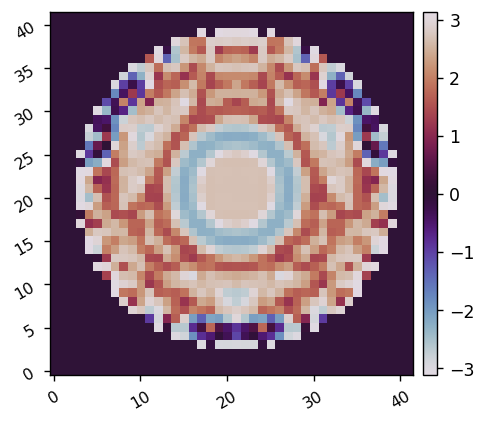

In [2]:
reload(falco_hlc_575_mp)
mp = falco_hlc_575_mp.setup_mp(Nitr=30, estimator='pwp-bp')

In [8]:
mp.est.probe.height = 10

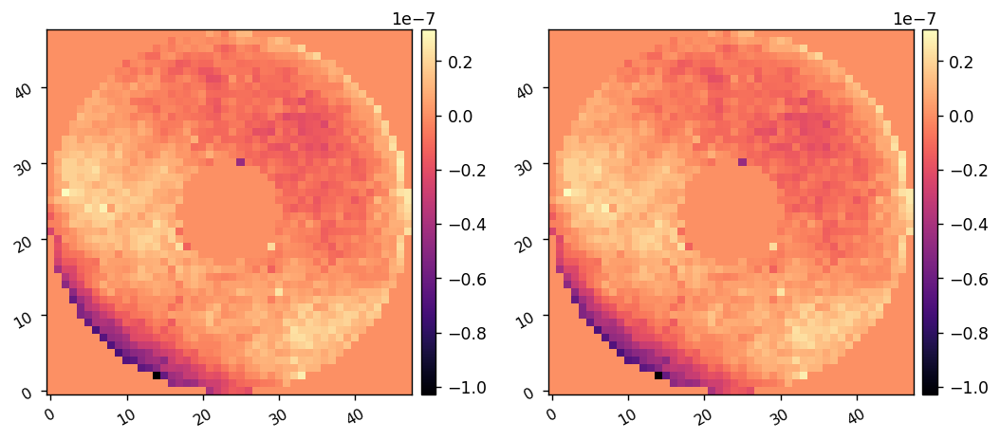

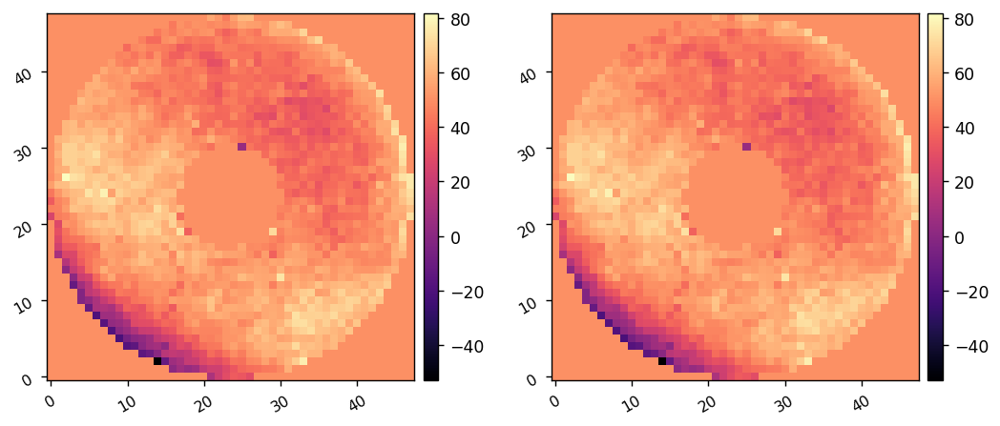

In [9]:
dm1_flat_fpath = Path('~/roman_phasec_v1.4/python/roman_phasec_proper/examples/hlc_flattened_dm1.fits')
dm2_flat_fpath = Path('~/roman_phasec_v1.4/python/roman_phasec_proper/examples/hlc_flattened_dm2.fits')

dm1_flat = fits.getdata(dm1_flat_fpath)
dm2_flat = fits.getdata(dm2_flat_fpath)
imshow2(dm1_flat, dm2_flat)

mp.full.dm1 = falco.config.Object()
mp.full.dm2 = falco.config.Object()

mp.full.dm1.flatmap = dm1_flat
mp.full.dm2.flatmap = dm2_flat

mp.dm1.biasMap = 50 + mp.full.dm1.flatmap/mp.dm1.VtoH  # Bias voltage. Needed prior to WFSC to allow + and - voltages. Total voltage is mp.dm1.biasMap + mp.dm1.V
mp.dm2.biasMap = 50 + mp.full.dm2.flatmap/mp.dm2.VtoH  # Bias voltage. Needed prior to WFSC to allow + and - voltages. Total voltage is mp.dm2.biasMap + mp.dm2.V
imshow2(mp.dm1.biasMap, mp.dm2.biasMap)

In [4]:
# DM starting voltages (in the PROPER model only)
# fn_dm1_design = os.path.join(str(flatmap_dir), 'dm1_m_design_hlc_band1.fits')
# fn_dm2_design = os.path.join(str(flatmap_dir), 'dm2_m_design_hlc_band1.fits')
# fn_dm1_flatmap = os.path.join(str(flatmap_dir), 'dm1_m_flat_hlc_band1.fits')
# fn_dm2_flatmap = os.path.join(str(flatmap_dir), 'dm2_m_flat_hlc_band1.fits')


# mp.full.dm1 = falco.config.Object()
# mp.full.dm2 = falco.config.Object()

# dm1_hlc_flatmap = fits.getdata(fn_dm1_flatmap)
# dm2_hlc_flatmap = fits.getdata(fn_dm2_flatmap)
# imshow2(dm1_hlc_flatmap, dm2_hlc_flatmap)

# dm1_hlc_design = fits.getdata(fn_dm1_design)
# dm2_hlc_design = fits.getdata(fn_dm2_design)
# imshow2(dm1_hlc_design, dm2_hlc_design)

# # mp.full.dm1.flatmap = dm1_hlc_flatmap + dm1_hlc_design
# # mp.full.dm2.flatmap = dm2_hlc_flatmap + dm2_hlc_design

# mp.full.dm1.flatmap = dm1_flat
# mp.full.dm2.flatmap = dm2_flat

# mp.dm1.biasMap = 50 + mp.full.dm1.flatmap/mp.dm1.VtoH  # Bias voltage. Needed prior to WFSC to allow + and - voltages. Total voltage is mp.dm1.biasMap + mp.dm1.V
# mp.dm2.biasMap = 50 + mp.full.dm2.flatmap/mp.dm2.VtoH  # Bias voltage. Needed prior to WFSC to allow + and - voltages. Total voltage is mp.dm2.biasMap + mp.dm2.V
# imshow2(mp.dm1.biasMap, mp.dm2.biasMap)


# Run idealized phase retrieval to make an accurate compact model

Running idealized phase retrieval ...


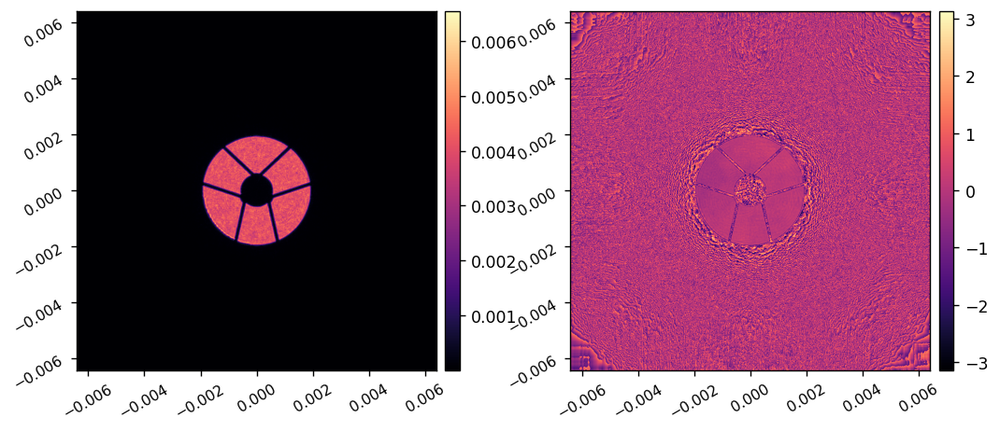

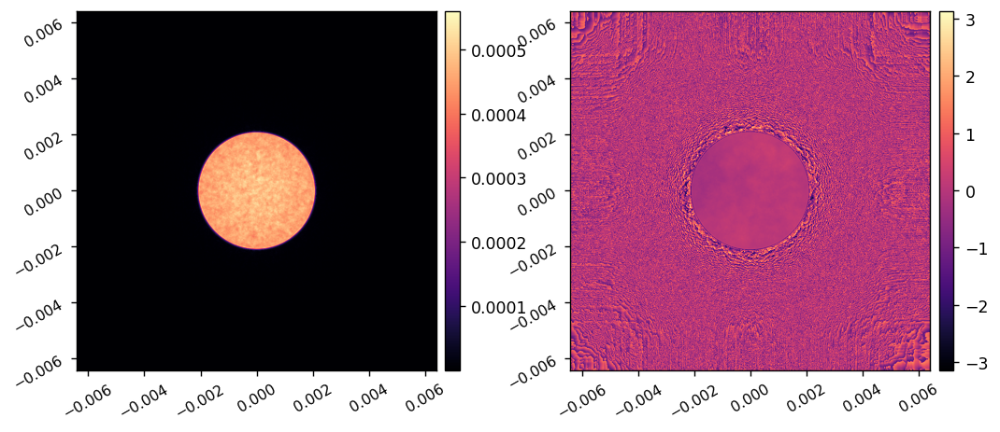

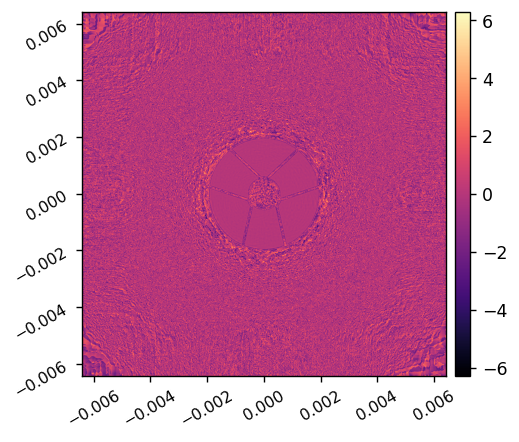

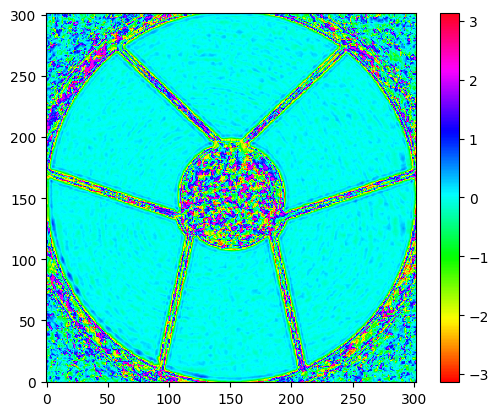

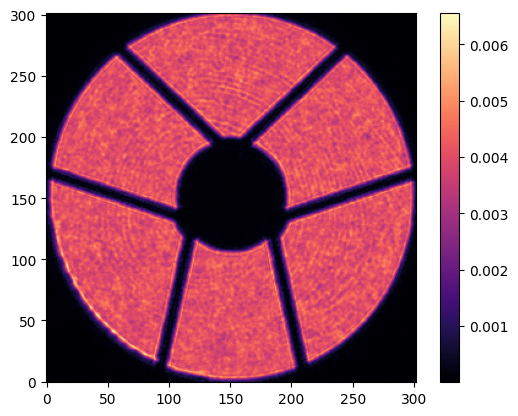

In [10]:
mp = pr.ipr(mp)

# Flesh out the workspace

hlc_575_test
 Using 1 discrete wavelength(s) in each of 1 sub-bandpasses over a 1.0% total bandpass 

Sub-bandpasses are centered at wavelengths [nm]:	 [575.]


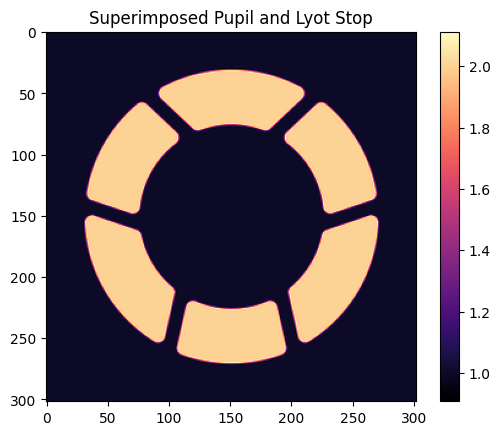

  Influence function padded from 84 to 84 points for A.S. propagation.
Computing datacube of DM influence functions... done.
  Influence function padded from 84 to 84 points for A.S. propagation.
Computing datacube of DM influence functions... done.


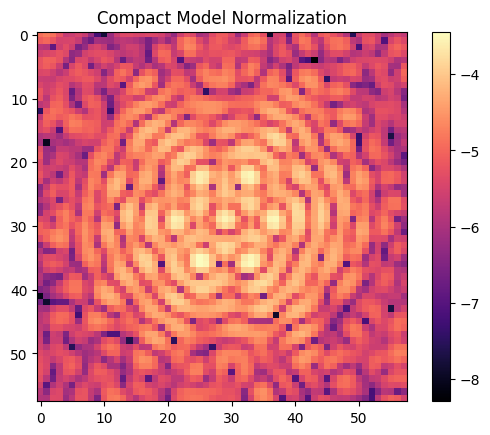

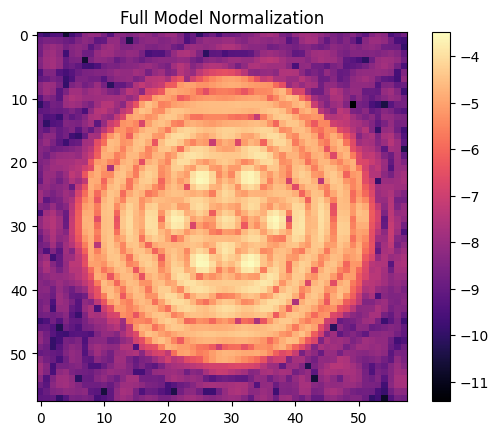


Beginning Trial 1 of Series 1.

DM 1-to-2 Fresnel number (using radius) = 932.0391304347827


In [11]:
# Record Keeping
mp.runLabel = ('hlc_575_test')
print(mp.runLabel)
mp.TrialNum = 1
mp.SeriesNum = 1

out = falco.setup.flesh_out_workspace(mp)


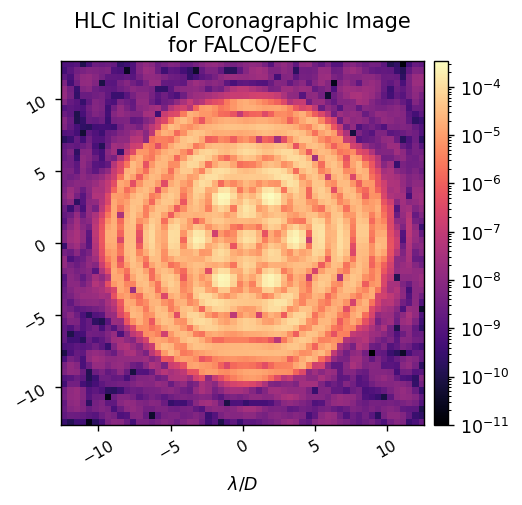

In [7]:
image = falco.get_summed_image(mp)
imshow1(image,  'HLC Initial Coronagraphic Image\nfor FALCO/EFC', 
        lognorm=True, vmin=1e-11, pxscl=1/mp.Fend.res, xlabel='$\lambda/D$')

# Perform the Wavefront Sensing and Control

Iteration: 0 / 29
Zernike modes (Noll indexing) used in this Jacobian:	[1]
DMs to be used in this iteration = [ 1 2 ]


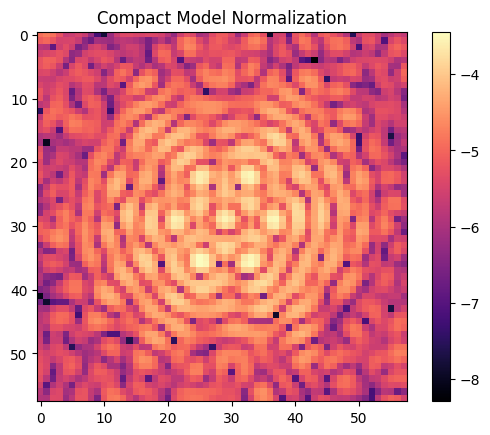

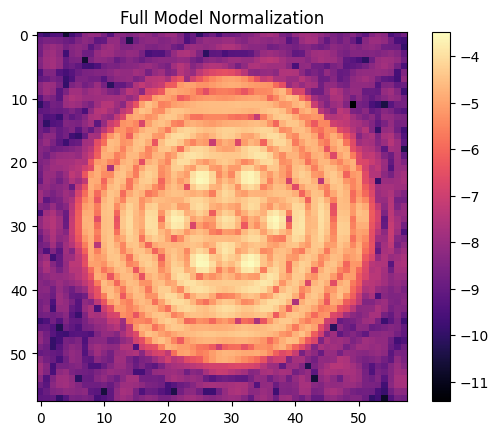

Core throughput within the half-max isophote(s) = 7.52% 	at separation = (-7.0, 0.0) lambda0/D.
Computing control Jacobian matrices in parallel...done.
Elapsed: 30.621315956115723
Weeding out weak actuators from the control Jacobian...
  DM1: 1775/2304 (77.04%) actuators kept for Jacobian
  DM2: 1782/2304 (77.34%) actuators kept for Jacobian
Estimating electric field with batch process estimation ...
Wavelength: 0/0 ... 
Mode: 0/0 ... 
Measured unprobed Inorm (Corr / Score): 3.00e-05 	3.25e-05
Chosen probe intensity: 5.82e-05
Actual Probe 0+ Contrast is: 9.74e-05
Actual Probe 0- Contrast is: 1.20e-04
Actual Probe 1+ Contrast is: 9.46e-05
Actual Probe 1- Contrast is: 1.16e-04
Actual Probe 2+ Contrast is: 9.31e-05
Actual Probe 2- Contrast is: 9.54e-05
*** Mean measured Inorm for probe #0  =	7.879e-05
*** Mean measured Inorm for probe #1  =	7.546e-05
*** Mean measured Inorm for probe #2  =	6.455e-05


/home/u21/kianmilani/Documents/falco-python/falco/plot.py:386: RuntimeWarning: divide by zero encountered in log10
  return np.log10(array)


55 of 730 pixels were given zero probe amplitude.
Completed pairwise probing estimation.


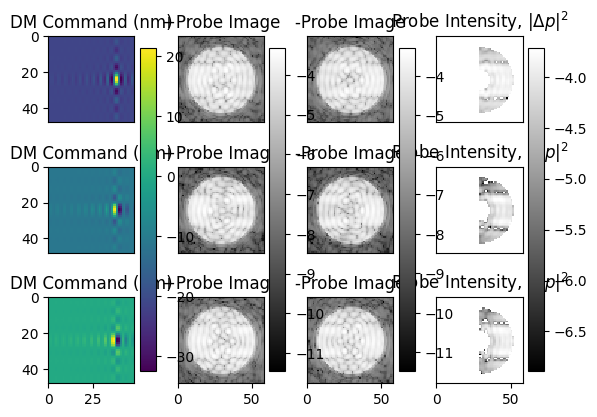

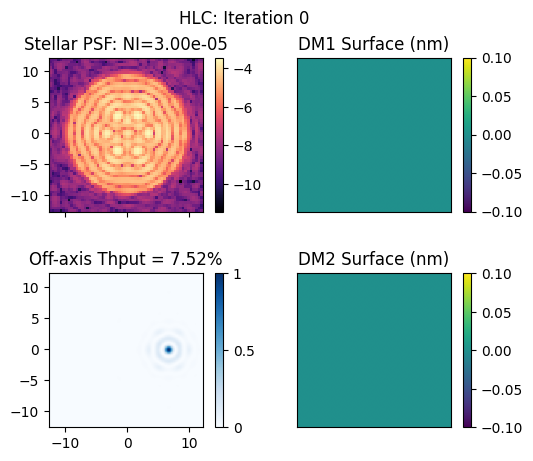

Using the Jacobian to make other matrices...done.
Control beginning ...
Scaling factor:		0.50		0.50		0.50		0.50		0.50		0.50		0.50		0.50		
log10reg:    		-6.0		-5.5		-5.0		-4.5		-4.0		-3.5		-3.0		-2.5		
Inorm:       		1.21e-03	6.56e-04	1.68e-04	1.87e-05	1.09e-05	9.84e-06	9.83e-06	1.01e-05	
Model-based grid search expects log10reg, = -3.0,	 dmfac = 0.50,	 9.83e-06 normalized intensity.
 DM1 P-V in volts: 20.142
 DM2 P-V in volts: 25.032
RMS surface of DM1 = 2.2 nm
RMS surface of DM2 = 2.6 nm
Previous Measured NI:			 3.00e-05 
Saving data snippet to:
	/home/u21/kianmilani/Documents/falco-python/data/brief/hlc_575_test_snippet.pkl  ...done.

Iteration: 1 / 29
Zernike modes (Noll indexing) used in this Jacobian:	[1]
DMs to be used in this iteration = [ 1 2 ]


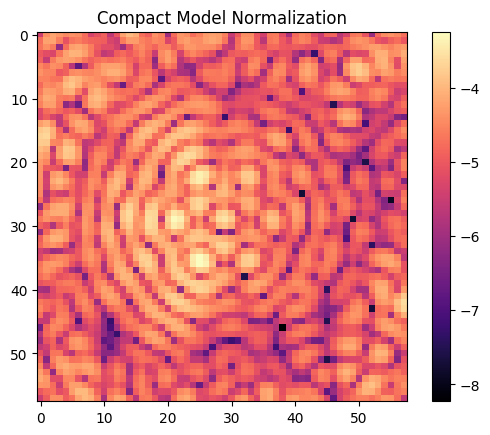

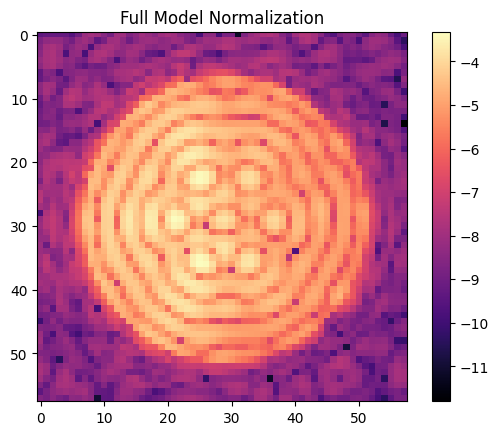

Core throughput within the half-max isophote(s) = 7.56% 	at separation = (-7.0, 0.0) lambda0/D.
Estimating electric field with batch process estimation ...
Wavelength: 0/0 ... 
Mode: 0/0 ... 
Measured unprobed Inorm (Corr / Score): 1.22e-05 	1.30e-05
Chosen probe intensity: 4.24e-05
Actual Probe 0+ Contrast is: 6.49e-05
Actual Probe 0- Contrast is: 7.59e-05
Actual Probe 1+ Contrast is: 6.53e-05
Actual Probe 1- Contrast is: 7.13e-05
Actual Probe 2+ Contrast is: 5.82e-05
Actual Probe 2- Contrast is: 5.52e-05
*** Mean measured Inorm for probe #0  =	5.823e-05
*** Mean measured Inorm for probe #1  =	5.628e-05
*** Mean measured Inorm for probe #2  =	4.462e-05
49 of 730 pixels were given zero probe amplitude.
Completed pairwise probing estimation.


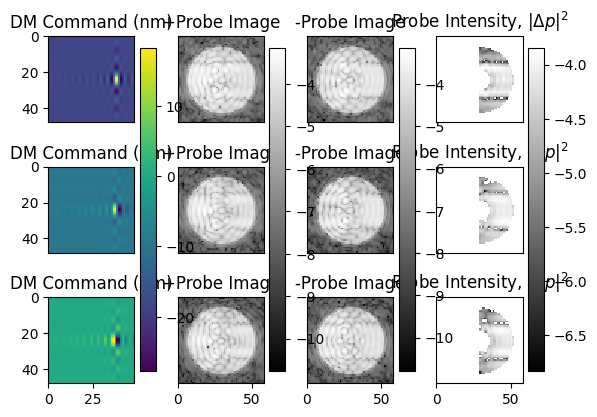

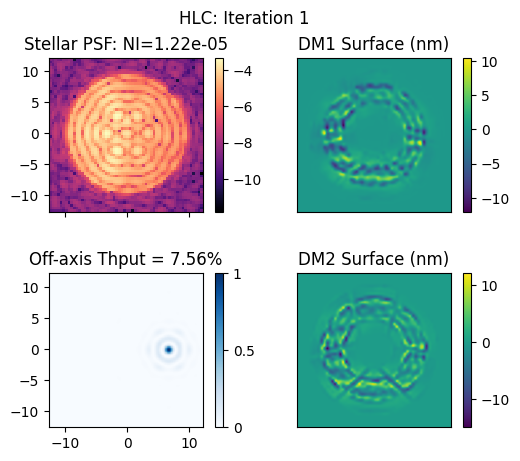

Complex projection of deltaE is 0.69    for subband 0/0
Complex correlation of deltaE is 0.84    for subband 0/0
Using the Jacobian to make other matrices...done.
Control beginning ...
Scaling factor:		0.50		0.50		0.50		0.50		0.50		0.50		0.50		0.50		
log10reg:    		-6.0		-5.5		-5.0		-4.5		-4.0		-3.5		-3.0		-2.5		
Inorm:       		1.61e-03	5.00e-04	8.12e-05	1.22e-05	4.18e-06	3.70e-06	3.71e-06	3.78e-06	
Model-based grid search expects log10reg, = -3.5,	 dmfac = 0.50,	 3.70e-06 normalized intensity.
 DM1 P-V in volts: 35.862
 DM2 P-V in volts: 48.498
RMS surface of DM1 = 3.9 nm
RMS surface of DM2 = 4.8 nm
Previous Measured NI:			 1.22e-05 
Saving data snippet to:
	/home/u21/kianmilani/Documents/falco-python/data/brief/hlc_575_test_snippet.pkl  ...done.

Iteration: 2 / 29
Zernike modes (Noll indexing) used in this Jacobian:	[1]
DMs to be used in this iteration = [ 1 2 ]


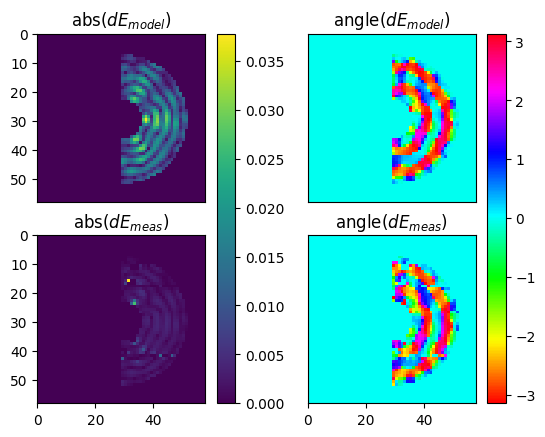

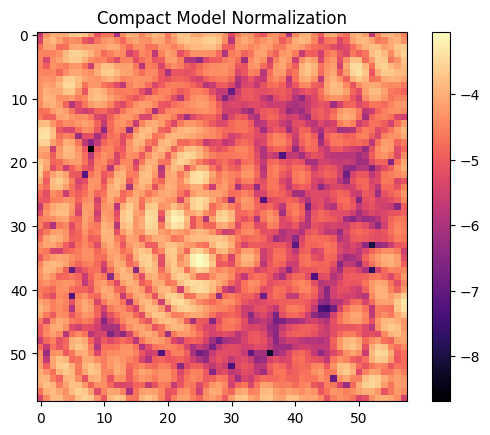

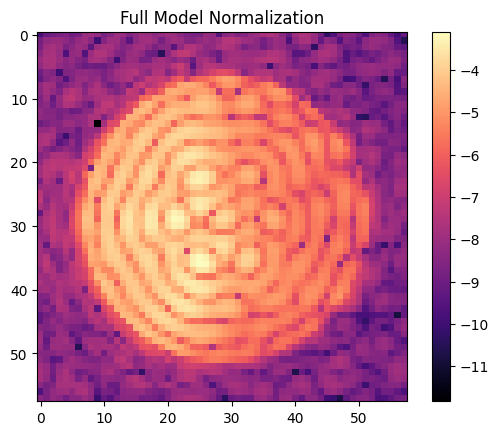

Core throughput within the half-max isophote(s) = 7.46% 	at separation = (-7.0, 0.0) lambda0/D.
Estimating electric field with batch process estimation ...
Wavelength: 0/0 ... 
Mode: 0/0 ... 
Measured unprobed Inorm (Corr / Score): 5.53e-06 	5.82e-06
Chosen probe intensity: 3.49e-05
Actual Probe 0+ Contrast is: 5.26e-05
Actual Probe 0- Contrast is: 5.84e-05
Actual Probe 1+ Contrast is: 5.08e-05
Actual Probe 1- Contrast is: 5.22e-05
Actual Probe 2+ Contrast is: 4.25e-05
Actual Probe 2- Contrast is: 3.97e-05
*** Mean measured Inorm for probe #0  =	4.998e-05
*** Mean measured Inorm for probe #1  =	4.610e-05
*** Mean measured Inorm for probe #2  =	3.564e-05
46 of 730 pixels were given zero probe amplitude.
Completed pairwise probing estimation.


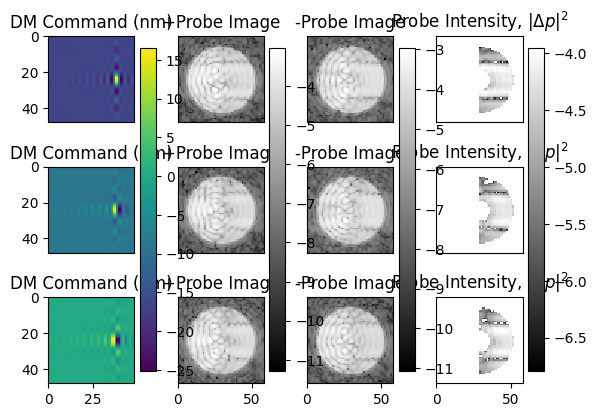

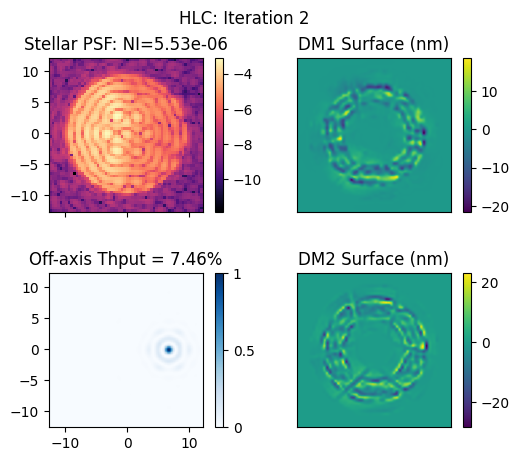

Complex projection of deltaE is 0.92    for subband 0/0
Complex correlation of deltaE is 0.63    for subband 0/0
Using the Jacobian to make other matrices...done.
Control beginning ...
Scaling factor:		0.50		0.50		0.50		0.50		0.50		0.50		0.50		0.50		
log10reg:    		-6.0		-5.5		-5.0		-4.5		-4.0		-3.5		-3.0		-2.5		
Inorm:       		8.02e-04	2.46e-04	7.09e-05	1.10e-05	3.98e-06	3.18e-06	2.99e-06	2.96e-06	
Model-based grid search expects log10reg, = -2.5,	 dmfac = 0.50,	 2.96e-06 normalized intensity.
 DM1 P-V in volts: 43.031
 DM2 P-V in volts: 55.910
RMS surface of DM1 = 4.5 nm
RMS surface of DM2 = 5.5 nm
Previous Measured NI:			 5.53e-06 
Saving data snippet to:
	/home/u21/kianmilani/Documents/falco-python/data/brief/hlc_575_test_snippet.pkl  ...done.

Iteration: 3 / 29
Zernike modes (Noll indexing) used in this Jacobian:	[1]
DMs to be used in this iteration = [ 1 2 ]


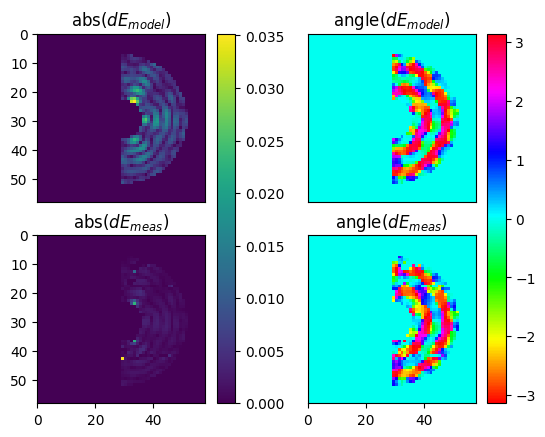

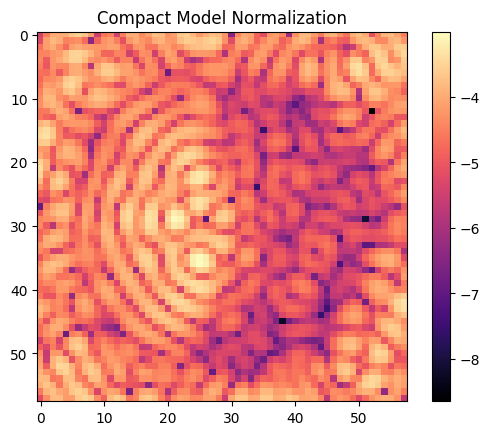

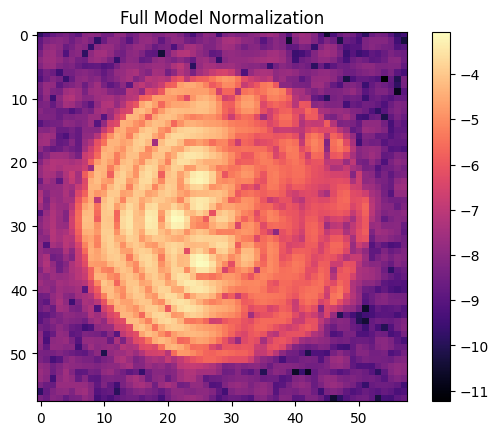

Core throughput within the half-max isophote(s) = 7.43% 	at separation = (-7.0, 0.0) lambda0/D.
Estimating electric field with batch process estimation ...
Wavelength: 0/0 ... 
Mode: 0/0 ... 
Measured unprobed Inorm (Corr / Score): 3.01e-06 	3.10e-06
Chosen probe intensity: 2.87e-05
Actual Probe 0+ Contrast is: 4.31e-05
Actual Probe 0- Contrast is: 4.61e-05
Actual Probe 1+ Contrast is: 4.12e-05
Actual Probe 1- Contrast is: 4.06e-05
Actual Probe 2+ Contrast is: 3.34e-05
Actual Probe 2- Contrast is: 3.11e-05
*** Mean measured Inorm for probe #0  =	4.157e-05
*** Mean measured Inorm for probe #1  =	3.792e-05
*** Mean measured Inorm for probe #2  =	2.930e-05
45 of 730 pixels were given zero probe amplitude.
Completed pairwise probing estimation.


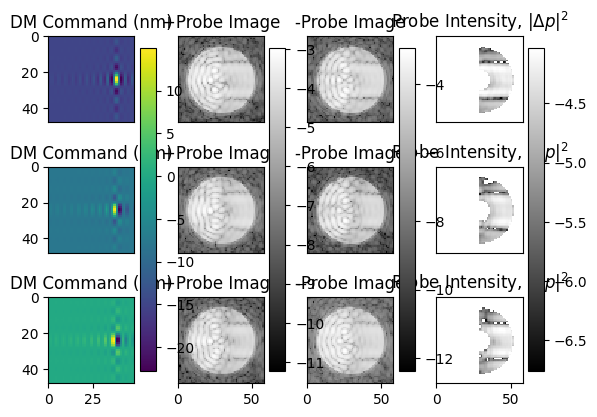

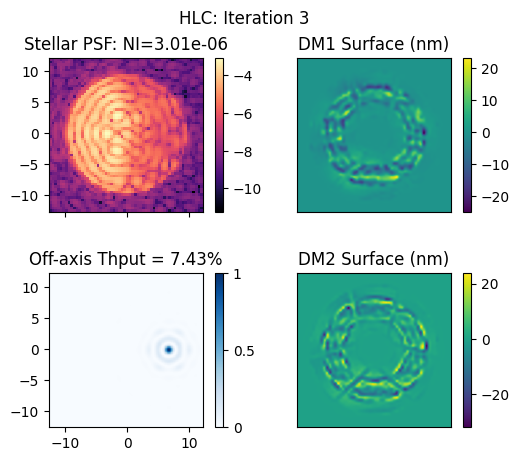

Complex projection of deltaE is 1.03    for subband 0/0
Complex correlation of deltaE is 0.69    for subband 0/0
Using the Jacobian to make other matrices...done.
Control beginning ...
Scaling factor:		0.50		0.50		0.50		0.50		0.50		0.50		0.50		0.50		
log10reg:    		-6.0		-5.5		-5.0		-4.5		-4.0		-3.5		-3.0		-2.5		
Inorm:       		8.18e-04	1.71e-04	2.82e-05	5.35e-06	2.92e-06	2.32e-06	2.14e-06	2.10e-06	
Model-based grid search expects log10reg, = -2.5,	 dmfac = 0.50,	 2.10e-06 normalized intensity.
 DM1 P-V in volts: 46.650
 DM2 P-V in volts: 64.660
RMS surface of DM1 = 5.0 nm
RMS surface of DM2 = 6.1 nm
Previous Measured NI:			 3.01e-06 
Saving data snippet to:
	/home/u21/kianmilani/Documents/falco-python/data/brief/hlc_575_test_snippet.pkl  ...done.

Iteration: 4 / 29
Zernike modes (Noll indexing) used in this Jacobian:	[1]
DMs to be used in this iteration = [ 1 2 ]


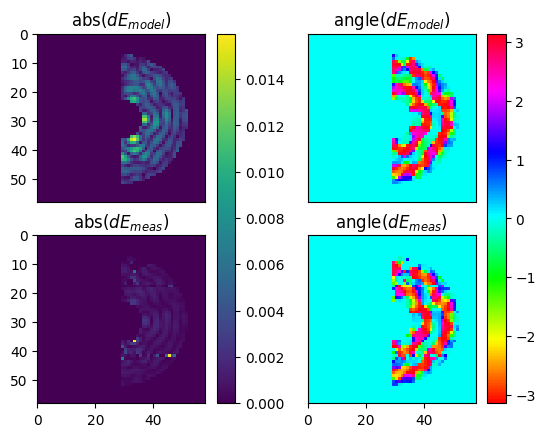

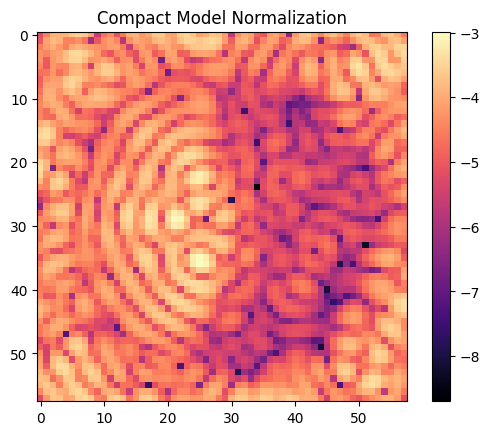

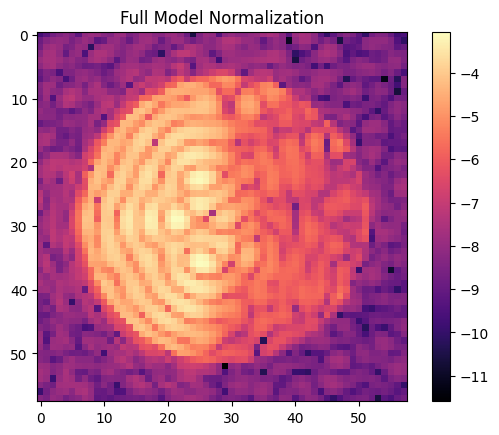

Core throughput within the half-max isophote(s) = 7.40% 	at separation = (-7.0, 0.0) lambda0/D.
Estimating electric field with batch process estimation ...
Wavelength: 0/0 ... 
Mode: 0/0 ... 
Measured unprobed Inorm (Corr / Score): 2.02e-06 	2.05e-06
Chosen probe intensity: 2.31e-05
Actual Probe 0+ Contrast is: 3.51e-05
Actual Probe 0- Contrast is: 3.67e-05
Actual Probe 1+ Contrast is: 3.28e-05
Actual Probe 1- Contrast is: 3.17e-05
Actual Probe 2+ Contrast is: 2.66e-05
Actual Probe 2- Contrast is: 2.48e-05
*** Mean measured Inorm for probe #0  =	3.391e-05
*** Mean measured Inorm for probe #1  =	3.026e-05
*** Mean measured Inorm for probe #2  =	2.368e-05
43 of 730 pixels were given zero probe amplitude.
Completed pairwise probing estimation.


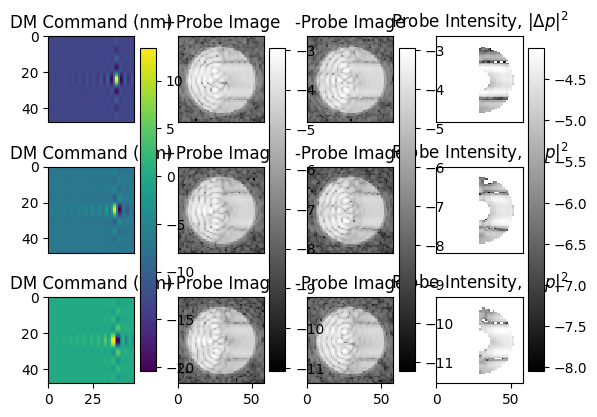

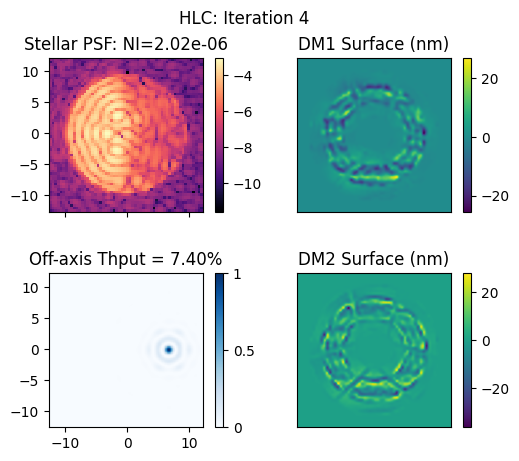

Complex projection of deltaE is 0.42    for subband 0/0
Complex correlation of deltaE is 0.14    for subband 0/0
Using the Jacobian to make other matrices...done.
Control beginning ...
Scaling factor:		0.50		0.50		0.50		0.50		0.50		0.50		0.50		0.50		
log10reg:    		-6.0		-5.5		-5.0		-4.5		-4.0		-3.5		-3.0		-2.5		
Inorm:       		9.72e-04	2.67e-04	5.09e-05	8.94e-06	4.20e-06	2.17e-06	1.93e-06	1.90e-06	
Model-based grid search expects log10reg, = -2.5,	 dmfac = 0.50,	 1.90e-06 normalized intensity.
 DM1 P-V in volts: 48.039
 DM2 P-V in volts: 71.835
RMS surface of DM1 = 5.4 nm
RMS surface of DM2 = 6.6 nm
Previous Measured NI:			 2.02e-06 
Saving data snippet to:
	/home/u21/kianmilani/Documents/falco-python/data/brief/hlc_575_test_snippet.pkl  ...done.

Iteration: 5 / 29
Zernike modes (Noll indexing) used in this Jacobian:	[1]
DMs to be used in this iteration = [ 1 2 ]


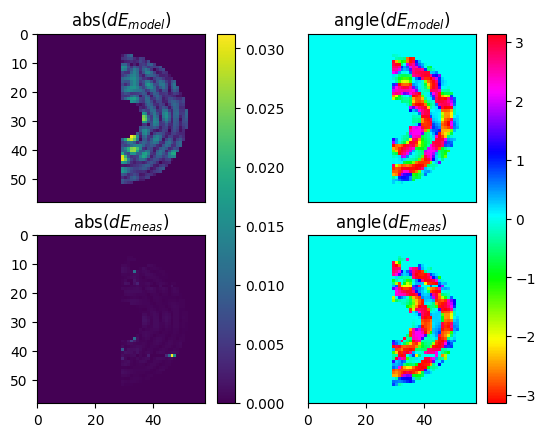

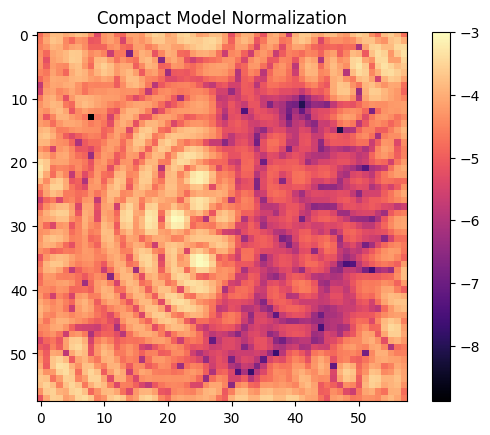

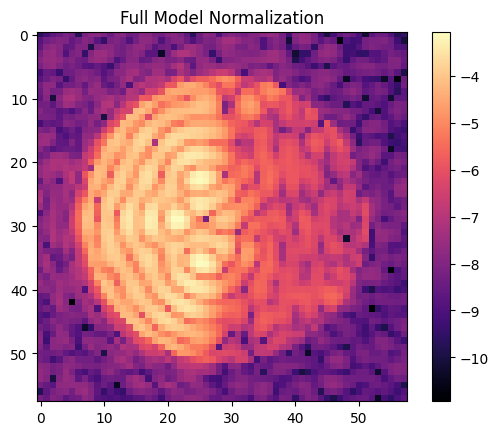

Core throughput within the half-max isophote(s) = 7.39% 	at separation = (-7.0, 0.0) lambda0/D.
Computing control Jacobian matrices in parallel...done.
Elapsed: 24.22106623649597
Estimating electric field with batch process estimation ...
Wavelength: 0/0 ... 
Mode: 0/0 ... 
Measured unprobed Inorm (Corr / Score): 1.38e-06 	1.39e-06
Chosen probe intensity: 1.57e-05
Actual Probe 0+ Contrast is: 2.48e-05
Actual Probe 0- Contrast is: 2.53e-05
Actual Probe 1+ Contrast is: 2.23e-05
Actual Probe 1- Contrast is: 2.11e-05
Actual Probe 2+ Contrast is: 1.78e-05
Actual Probe 2- Contrast is: 1.69e-05
*** Mean measured Inorm for probe #0  =	2.366e-05
*** Mean measured Inorm for probe #1  =	2.034e-05
*** Mean measured Inorm for probe #2  =	1.598e-05
49 of 730 pixels were given zero probe amplitude.
Completed pairwise probing estimation.


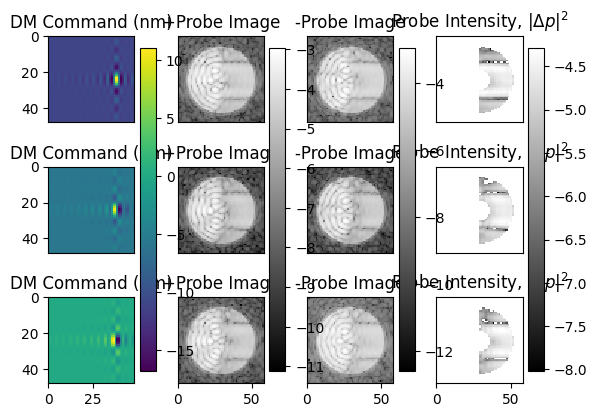

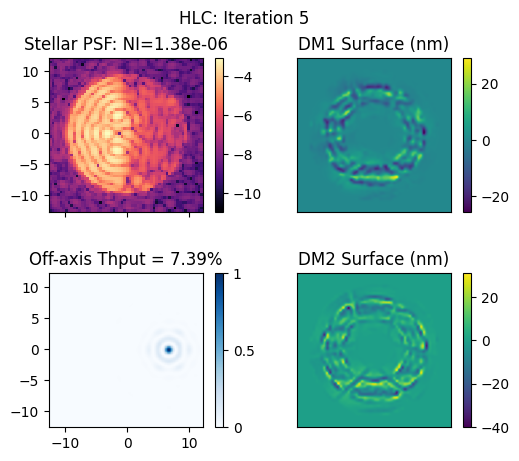

Complex projection of deltaE is 1.95    for subband 0/0
Complex correlation of deltaE is 0.66    for subband 0/0
Using the Jacobian to make other matrices...done.
Control beginning ...
Scaling factor:		0.50		0.50		0.50		0.50		0.50		0.50		0.50		0.50		
log10reg:    		-6.0		-5.5		-5.0		-4.5		-4.0		-3.5		-3.0		-2.5		
Inorm:       		8.62e-04	1.46e-04	1.52e-05	3.79e-06	1.58e-06	1.17e-06	1.13e-06	1.15e-06	
Model-based grid search expects log10reg, = -3.0,	 dmfac = 0.50,	 1.13e-06 normalized intensity.
 DM1 P-V in volts: 48.153
 DM2 P-V in volts: 71.401
RMS surface of DM1 = 5.5 nm
RMS surface of DM2 = 6.8 nm
Previous Measured NI:			 1.38e-06 
Saving data snippet to:
	/home/u21/kianmilani/Documents/falco-python/data/brief/hlc_575_test_snippet.pkl  ...done.

Iteration: 6 / 29
Zernike modes (Noll indexing) used in this Jacobian:	[1]
DMs to be used in this iteration = [ 1 2 ]


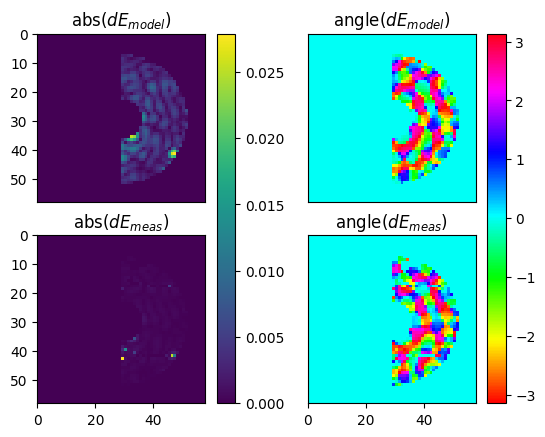

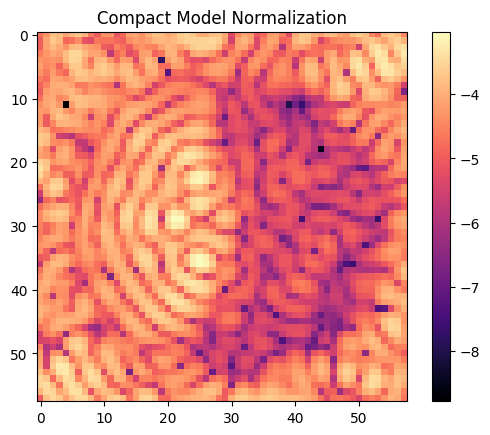

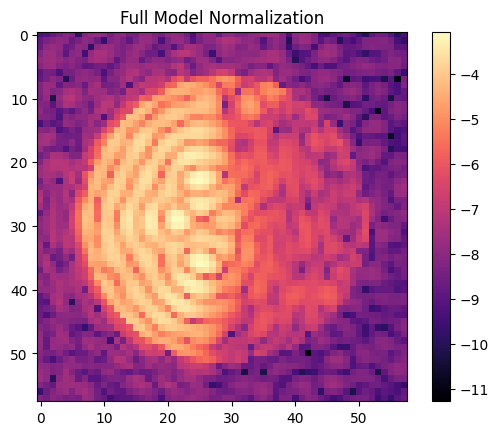

Core throughput within the half-max isophote(s) = 7.37% 	at separation = (-7.0, 0.0) lambda0/D.
Estimating electric field with batch process estimation ...
Wavelength: 0/0 ... 
Mode: 0/0 ... 
Measured unprobed Inorm (Corr / Score): 1.04e-06 	1.05e-06
Chosen probe intensity: 1.52e-05
Actual Probe 0+ Contrast is: 2.40e-05
Actual Probe 0- Contrast is: 2.44e-05
Actual Probe 1+ Contrast is: 2.09e-05
Actual Probe 1- Contrast is: 2.04e-05
Actual Probe 2+ Contrast is: 1.66e-05
Actual Probe 2- Contrast is: 1.62e-05
*** Mean measured Inorm for probe #0  =	2.314e-05
*** Mean measured Inorm for probe #1  =	1.965e-05
*** Mean measured Inorm for probe #2  =	1.537e-05
43 of 730 pixels were given zero probe amplitude.
Completed pairwise probing estimation.


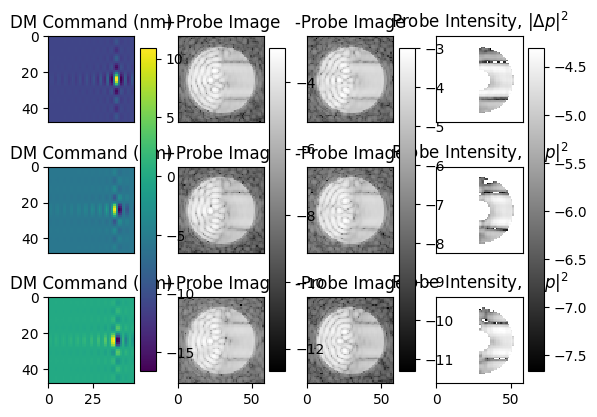

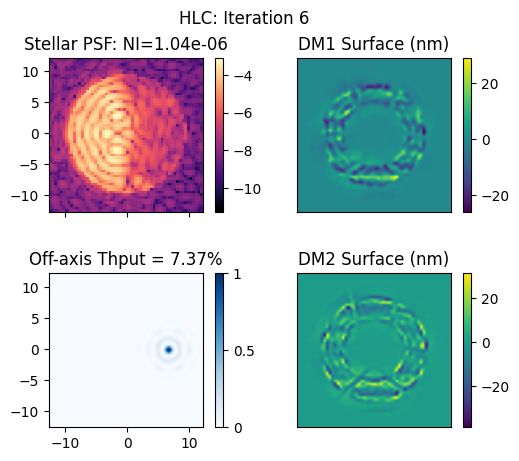

Complex projection of deltaE is 8.64    for subband 0/0
Complex correlation of deltaE is 0.53    for subband 0/0
Using the Jacobian to make other matrices...done.
Control beginning ...
Scaling factor:		0.50		0.50		0.50		0.50		0.50		0.50		0.50		0.50		
log10reg:    		-6.0		-5.5		-5.0		-4.5		-4.0		-3.5		-3.0		-2.5		
Inorm:       		1.05e-03	8.68e-04	2.71e-04	2.57e-05	6.41e-06	4.17e-06	3.86e-06	3.89e-06	
Model-based grid search expects log10reg, = -3.0,	 dmfac = 0.50,	 3.86e-06 normalized intensity.
 DM1 P-V in volts: 53.562
 DM2 P-V in volts: 72.381
RMS surface of DM1 = 5.9 nm
RMS surface of DM2 = 7.1 nm
Previous Measured NI:			 1.04e-06 
Saving data snippet to:
	/home/u21/kianmilani/Documents/falco-python/data/brief/hlc_575_test_snippet.pkl  ...done.

Iteration: 7 / 29
Zernike modes (Noll indexing) used in this Jacobian:	[1]
DMs to be used in this iteration = [ 1 2 ]


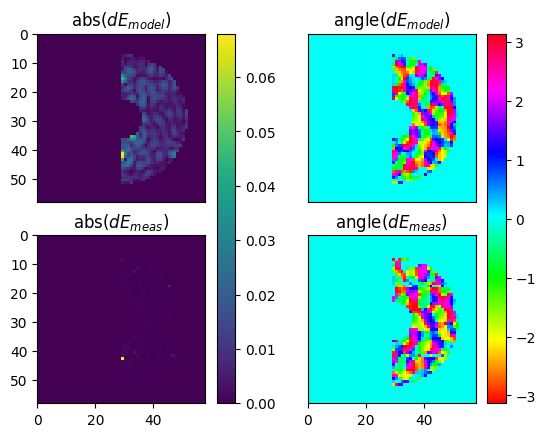

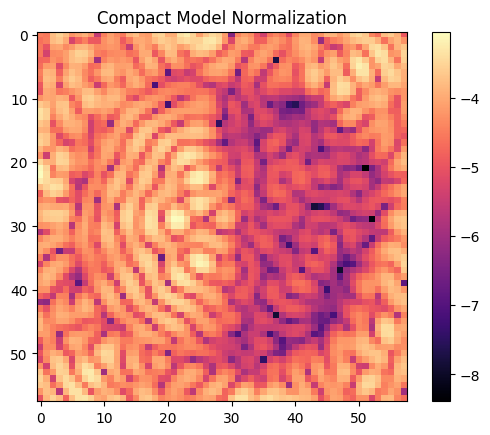

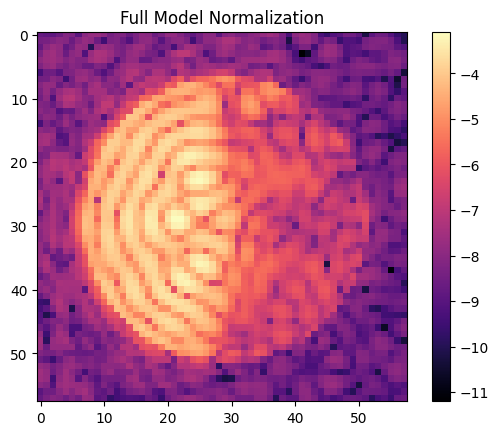

Core throughput within the half-max isophote(s) = 7.32% 	at separation = (-7.0, 0.0) lambda0/D.
Estimating electric field with batch process estimation ...
Wavelength: 0/0 ... 
Mode: 0/0 ... 
Measured unprobed Inorm (Corr / Score): 1.14e-06 	1.14e-06
Chosen probe intensity: 1.55e-05
Actual Probe 0+ Contrast is: 2.44e-05
Actual Probe 0- Contrast is: 2.46e-05
Actual Probe 1+ Contrast is: 2.15e-05
Actual Probe 1- Contrast is: 2.05e-05
Actual Probe 2+ Contrast is: 1.72e-05
Actual Probe 2- Contrast is: 1.65e-05
*** Mean measured Inorm for probe #0  =	2.337e-05
*** Mean measured Inorm for probe #1  =	1.991e-05
*** Mean measured Inorm for probe #2  =	1.572e-05
36 of 730 pixels were given zero probe amplitude.
Completed pairwise probing estimation.


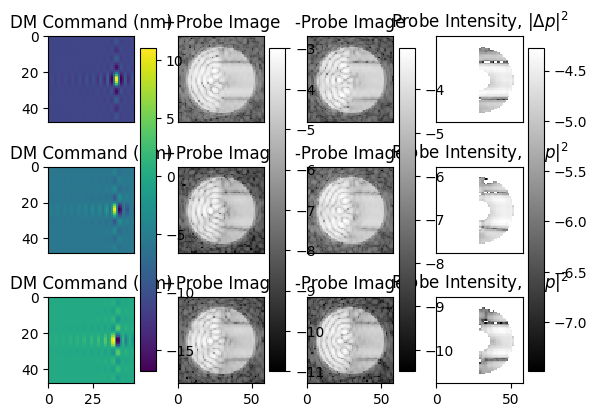

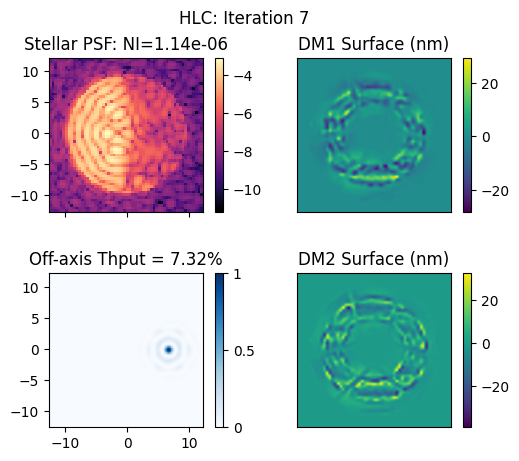

Complex projection of deltaE is 2.76    for subband 0/0
Complex correlation of deltaE is 0.56    for subband 0/0
Using the Jacobian to make other matrices...done.
Control beginning ...
Scaling factor:		0.50		0.50		0.50		0.50		0.50		0.50		0.50		0.50		
log10reg:    		-6.0		-5.5		-5.0		-4.5		-4.0		-3.5		-3.0		-2.5		
Inorm:       		1.27e-03	5.01e-04	1.01e-04	1.31e-05	4.94e-06	3.39e-06	3.09e-06	3.06e-06	
Model-based grid search expects log10reg, = -2.5,	 dmfac = 0.50,	 3.06e-06 normalized intensity.
 DM1 P-V in volts: 53.143
 DM2 P-V in volts: 70.480
RMS surface of DM1 = 5.8 nm
RMS surface of DM2 = 7.0 nm
Previous Measured NI:			 1.14e-06 
Saving data snippet to:
	/home/u21/kianmilani/Documents/falco-python/data/brief/hlc_575_test_snippet.pkl  ...done.

Iteration: 8 / 29
Zernike modes (Noll indexing) used in this Jacobian:	[1]
DMs to be used in this iteration = [ 1 2 ]


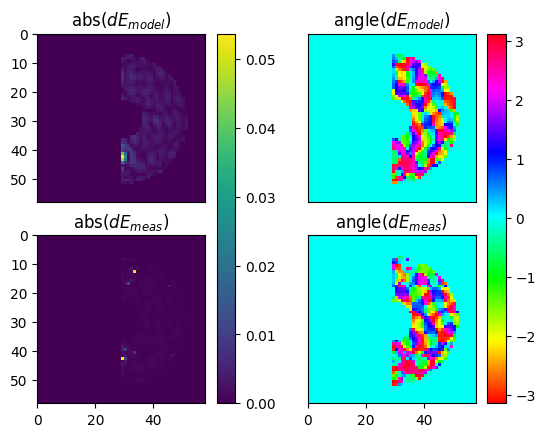

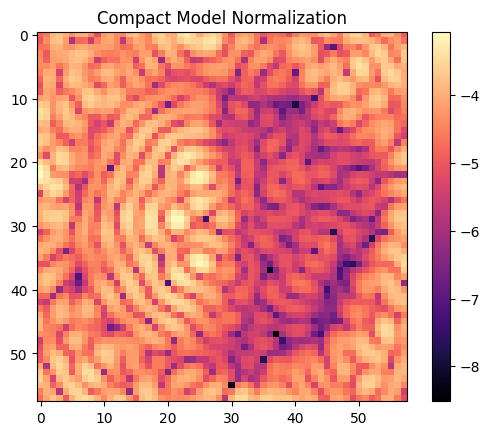

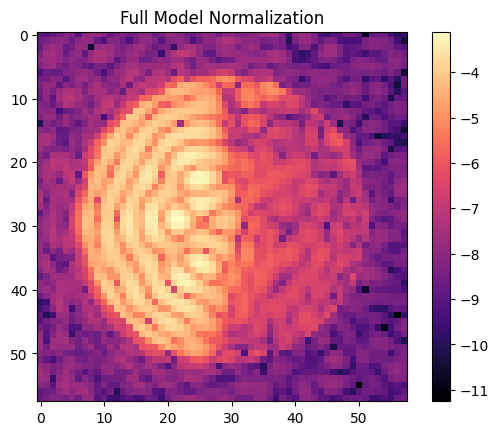

Core throughput within the half-max isophote(s) = 7.34% 	at separation = (-7.0, 0.0) lambda0/D.
Estimating electric field with batch process estimation ...
Wavelength: 0/0 ... 
Mode: 0/0 ... 
Measured unprobed Inorm (Corr / Score): 7.44e-07 	7.13e-07
Chosen probe intensity: 1.36e-05
Actual Probe 0+ Contrast is: 2.13e-05
Actual Probe 0- Contrast is: 2.11e-05
Actual Probe 1+ Contrast is: 1.85e-05
Actual Probe 1- Contrast is: 1.80e-05
Actual Probe 2+ Contrast is: 1.43e-05
Actual Probe 2- Contrast is: 1.44e-05
*** Mean measured Inorm for probe #0  =	2.048e-05
*** Mean measured Inorm for probe #1  =	1.749e-05
*** Mean measured Inorm for probe #2  =	1.364e-05
30 of 730 pixels were given zero probe amplitude.
Completed pairwise probing estimation.


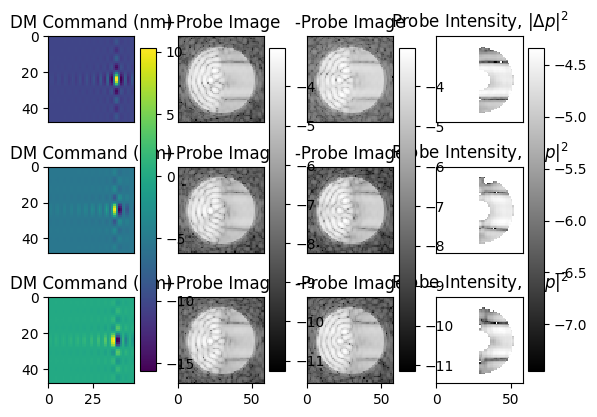

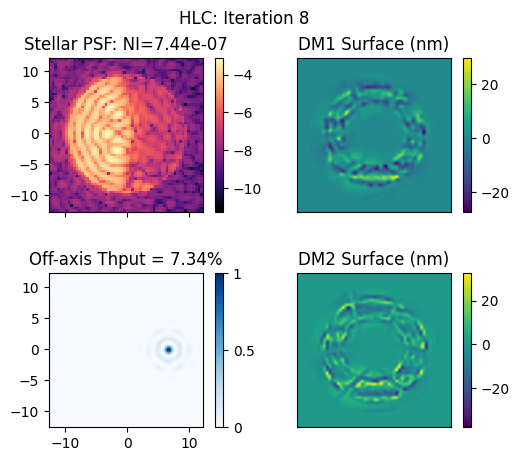

Complex projection of deltaE is 2.47    for subband 0/0
Complex correlation of deltaE is 0.53    for subband 0/0
Using the Jacobian to make other matrices...done.
Control beginning ...
Scaling factor:		0.50		0.50		0.50		0.50		0.50		0.50		0.50		0.50		
log10reg:    		-6.0		-5.5		-5.0		-4.5		-4.0		-3.5		-3.0		-2.5		
Inorm:       		8.15e-05	1.49e-05	3.54e-06	1.31e-06	6.61e-07	4.42e-07	3.67e-07	3.47e-07	
Model-based grid search expects log10reg, = -2.5,	 dmfac = 0.50,	 3.47e-07 normalized intensity.
 DM1 P-V in volts: 51.959
 DM2 P-V in volts: 70.588
RMS surface of DM1 = 5.8 nm
RMS surface of DM2 = 7.1 nm
Previous Measured NI:			 7.44e-07 
Saving data snippet to:
	/home/u21/kianmilani/Documents/falco-python/data/brief/hlc_575_test_snippet.pkl  ...done.

Iteration: 9 / 29
Zernike modes (Noll indexing) used in this Jacobian:	[1]
DMs to be used in this iteration = [ 1 2 ]


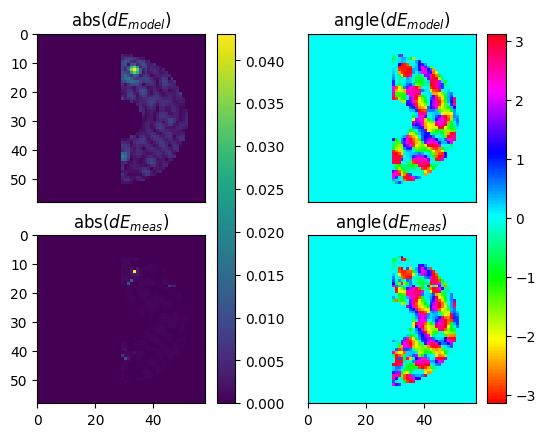

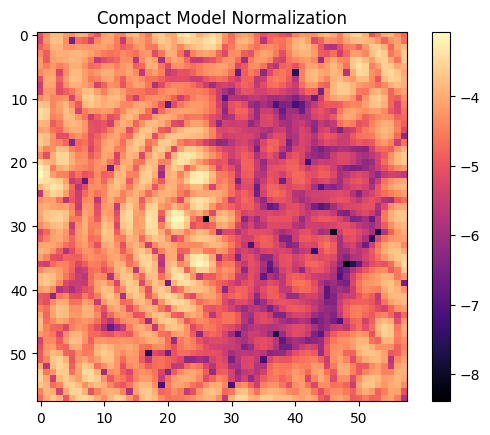

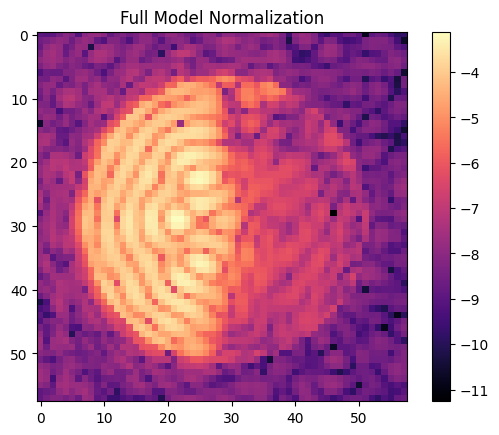

Core throughput within the half-max isophote(s) = 7.34% 	at separation = (-7.0, 0.0) lambda0/D.
Estimating electric field with batch process estimation ...
Wavelength: 0/0 ... 
Mode: 0/0 ... 
Measured unprobed Inorm (Corr / Score): 5.38e-07 	5.02e-07
Chosen probe intensity: 1.31e-05
Actual Probe 0+ Contrast is: 2.05e-05
Actual Probe 0- Contrast is: 2.03e-05
Actual Probe 1+ Contrast is: 1.77e-05
Actual Probe 1- Contrast is: 1.72e-05
Actual Probe 2+ Contrast is: 1.36e-05
Actual Probe 2- Contrast is: 1.37e-05
*** Mean measured Inorm for probe #0  =	1.990e-05
*** Mean measured Inorm for probe #1  =	1.692e-05
*** Mean measured Inorm for probe #2  =	1.312e-05
25 of 730 pixels were given zero probe amplitude.
Completed pairwise probing estimation.


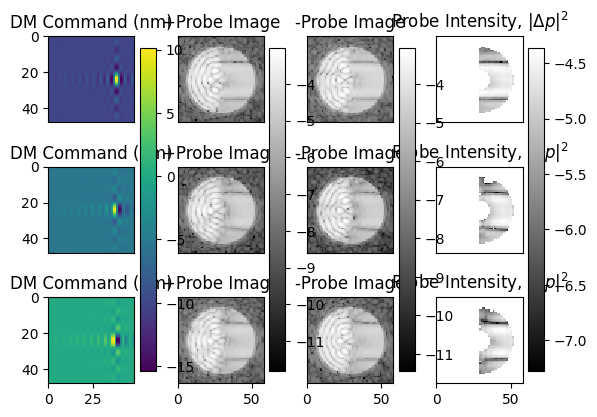

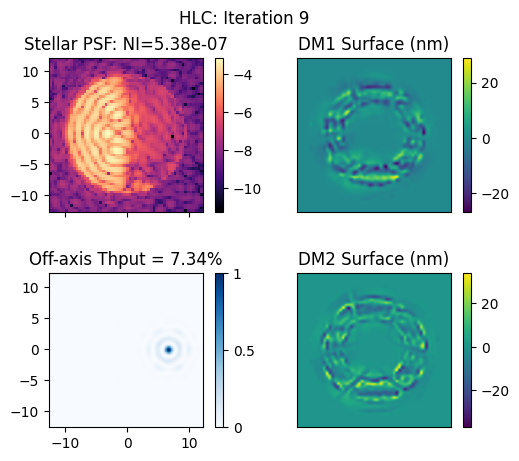

Complex projection of deltaE is 2.36    for subband 0/0
Complex correlation of deltaE is 0.26    for subband 0/0
Using the Jacobian to make other matrices...done.
Control beginning ...
Scaling factor:		0.50		0.50		0.50		0.50		0.50		0.50		0.50		0.50		
log10reg:    		-6.0		-5.5		-5.0		-4.5		-4.0		-3.5		-3.0		-2.5		
Inorm:       		2.61e-04	3.72e-05	6.50e-06	1.99e-06	9.93e-07	6.96e-07	6.03e-07	5.79e-07	
Model-based grid search expects log10reg, = -2.5,	 dmfac = 0.50,	 5.79e-07 normalized intensity.
 DM1 P-V in volts: 50.855
 DM2 P-V in volts: 70.658
RMS surface of DM1 = 5.8 nm
RMS surface of DM2 = 7.1 nm
Previous Measured NI:			 5.38e-07 
Saving data snippet to:
	/home/u21/kianmilani/Documents/falco-python/data/brief/hlc_575_test_snippet.pkl  ...done.

Iteration: 10 / 29
Zernike modes (Noll indexing) used in this Jacobian:	[1]
DMs to be used in this iteration = [ 1 2 ]


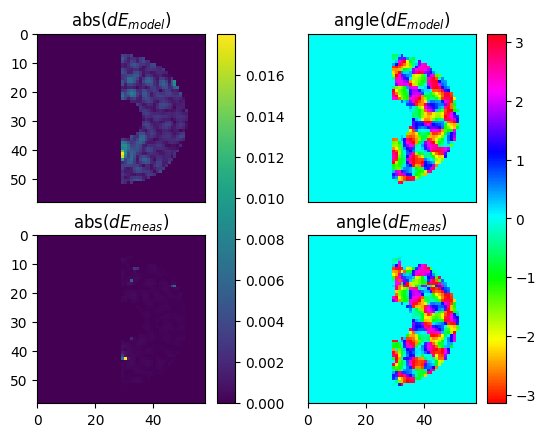

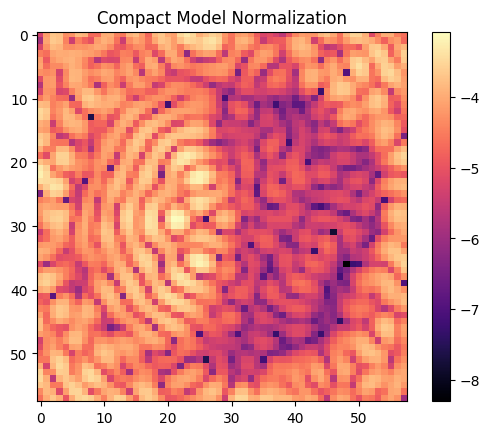

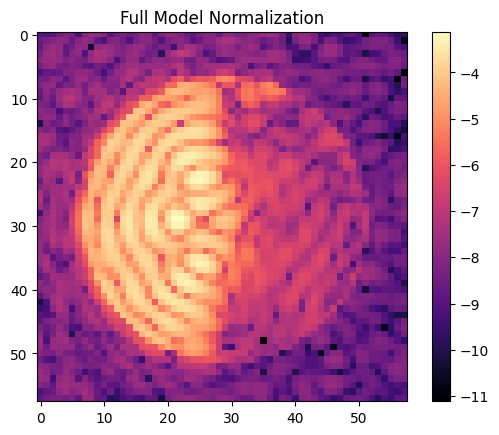

Core throughput within the half-max isophote(s) = 7.35% 	at separation = (-7.0, 0.0) lambda0/D.
Computing control Jacobian matrices in parallel...done.
Elapsed: 25.332255125045776
Estimating electric field with batch process estimation ...
Wavelength: 0/0 ... 
Mode: 0/0 ... 
Measured unprobed Inorm (Corr / Score): 4.38e-07 	4.01e-07
Chosen probe intensity: 1.28e-05
Actual Probe 0+ Contrast is: 2.00e-05
Actual Probe 0- Contrast is: 1.98e-05
Actual Probe 1+ Contrast is: 1.71e-05
Actual Probe 1- Contrast is: 1.67e-05
Actual Probe 2+ Contrast is: 1.31e-05
Actual Probe 2- Contrast is: 1.32e-05
*** Mean measured Inorm for probe #0  =	1.945e-05
*** Mean measured Inorm for probe #1  =	1.650e-05
*** Mean measured Inorm for probe #2  =	1.275e-05
20 of 730 pixels were given zero probe amplitude.
Completed pairwise probing estimation.


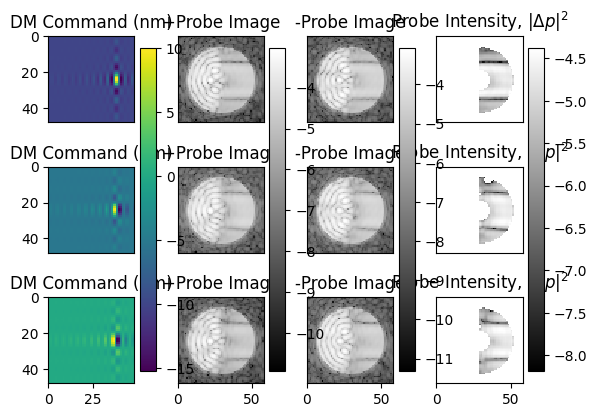

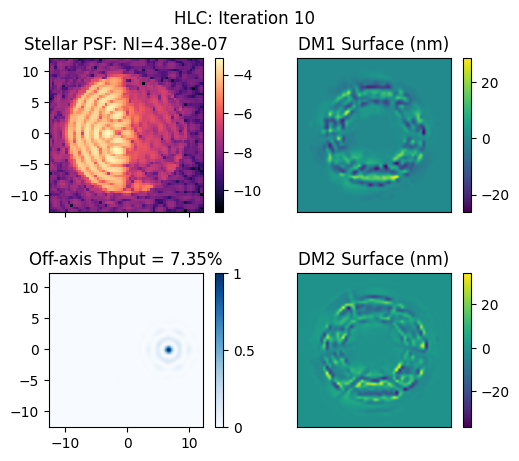

Complex projection of deltaE is 3.13    for subband 0/0
Complex correlation of deltaE is 0.35    for subband 0/0
Using the Jacobian to make other matrices...done.
Control beginning ...
Scaling factor:		0.50		0.50		0.50		0.50		0.50		0.50		0.50		0.50		
log10reg:    		-6.0		-5.5		-5.0		-4.5		-4.0		-3.5		-3.0		-2.5		
Inorm:       		2.68e-05	3.87e-06	7.69e-07	2.61e-07	1.61e-07	1.45e-07	1.47e-07	1.53e-07	
Model-based grid search expects log10reg, = -3.5,	 dmfac = 0.50,	 1.45e-07 normalized intensity.
 DM1 P-V in volts: 52.237
 DM2 P-V in volts: 69.061
RMS surface of DM1 = 5.9 nm
RMS surface of DM2 = 7.2 nm
Previous Measured NI:			 4.38e-07 
Saving data snippet to:
	/home/u21/kianmilani/Documents/falco-python/data/brief/hlc_575_test_snippet.pkl  ...done.

Iteration: 11 / 29
Zernike modes (Noll indexing) used in this Jacobian:	[1]
DMs to be used in this iteration = [ 1 2 ]


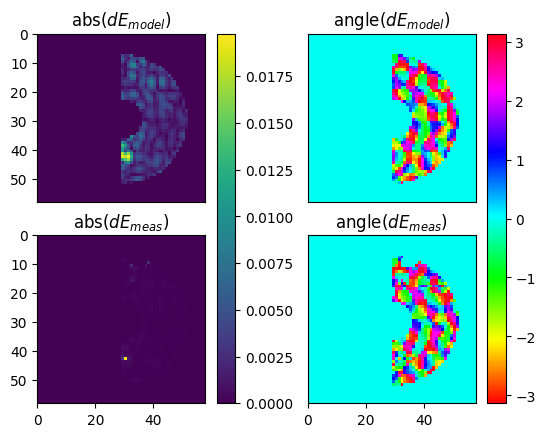

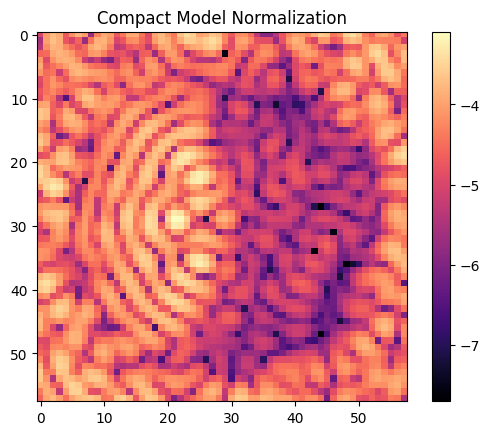

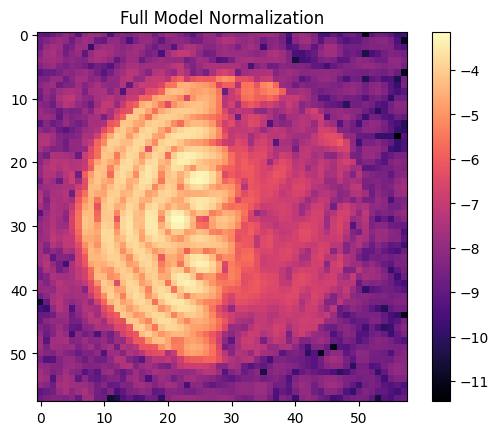

Core throughput within the half-max isophote(s) = 7.30% 	at separation = (-7.0, 0.0) lambda0/D.
Estimating electric field with batch process estimation ...
Wavelength: 0/0 ... 
Mode: 0/0 ... 
Measured unprobed Inorm (Corr / Score): 3.66e-07 	3.27e-07
Chosen probe intensity: 1.24e-05
Actual Probe 0+ Contrast is: 1.92e-05
Actual Probe 0- Contrast is: 1.91e-05
Actual Probe 1+ Contrast is: 1.63e-05
Actual Probe 1- Contrast is: 1.61e-05
Actual Probe 2+ Contrast is: 1.27e-05
Actual Probe 2- Contrast is: 1.28e-05
*** Mean measured Inorm for probe #0  =	1.875e-05
*** Mean measured Inorm for probe #1  =	1.586e-05
*** Mean measured Inorm for probe #2  =	1.239e-05
25 of 730 pixels were given zero probe amplitude.
Completed pairwise probing estimation.


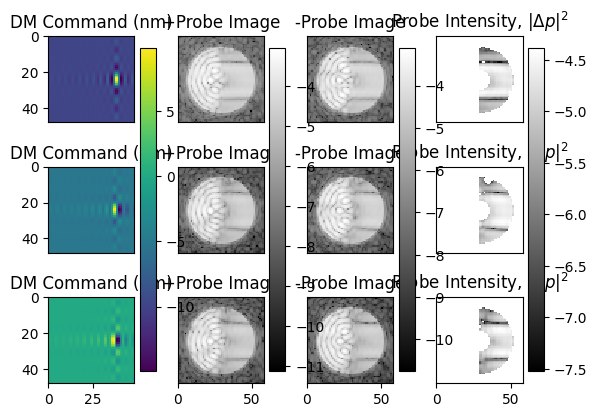

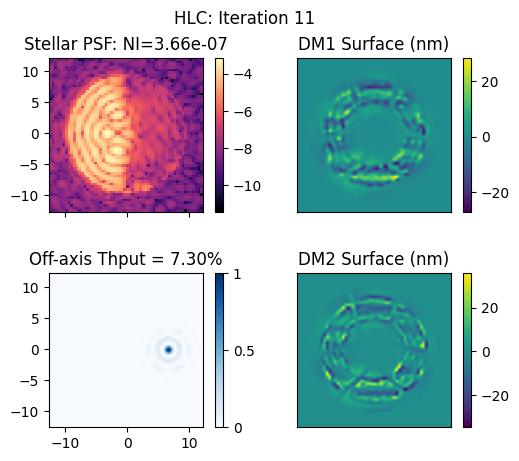

Complex projection of deltaE is 1.63    for subband 0/0
Complex correlation of deltaE is 0.91    for subband 0/0
Using the Jacobian to make other matrices...done.
Control beginning ...
Scaling factor:		0.50		0.50		0.50		0.50		0.50		0.50		0.50		0.50		
log10reg:    		-6.0		-5.5		-5.0		-4.5		-4.0		-3.5		-3.0		-2.5		
Inorm:       		4.92e-05	7.10e-06	1.50e-06	4.43e-07	2.17e-07	1.63e-07	1.52e-07	1.52e-07	
Model-based grid search expects log10reg, = -2.5,	 dmfac = 0.50,	 1.52e-07 normalized intensity.
 DM1 P-V in volts: 52.305
 DM2 P-V in volts: 69.219
RMS surface of DM1 = 5.9 nm
RMS surface of DM2 = 7.2 nm
Previous Measured NI:			 3.66e-07 
Saving data snippet to:
	/home/u21/kianmilani/Documents/falco-python/data/brief/hlc_575_test_snippet.pkl  ...done.

Iteration: 12 / 29
Zernike modes (Noll indexing) used in this Jacobian:	[1]
DMs to be used in this iteration = [ 1 2 ]


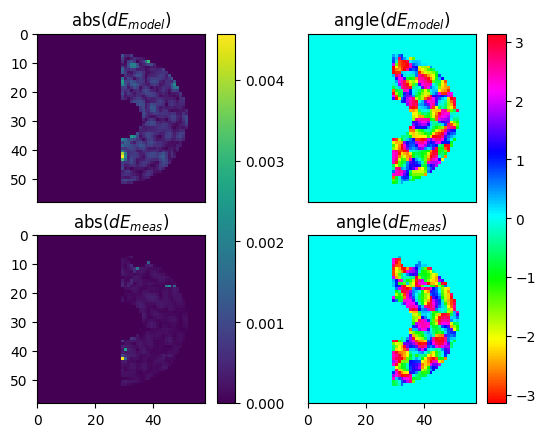

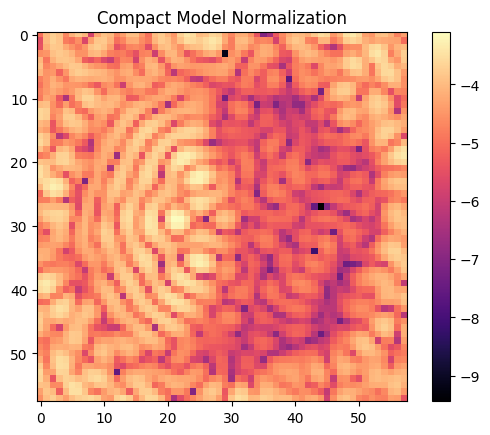

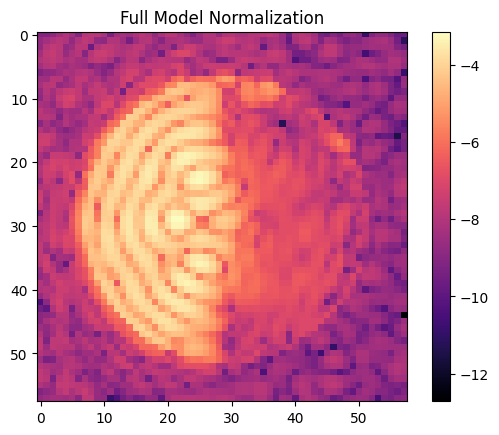

Core throughput within the half-max isophote(s) = 7.29% 	at separation = (-7.0, 0.0) lambda0/D.
Estimating electric field with batch process estimation ...
Wavelength: 0/0 ... 
Mode: 0/0 ... 
Measured unprobed Inorm (Corr / Score): 3.31e-07 	2.90e-07
Chosen probe intensity: 1.20e-05
Actual Probe 0+ Contrast is: 1.86e-05
Actual Probe 0- Contrast is: 1.86e-05
Actual Probe 1+ Contrast is: 1.58e-05
Actual Probe 1- Contrast is: 1.56e-05
Actual Probe 2+ Contrast is: 1.23e-05
Actual Probe 2- Contrast is: 1.25e-05
*** Mean measured Inorm for probe #0  =	1.824e-05
*** Mean measured Inorm for probe #1  =	1.541e-05
*** Mean measured Inorm for probe #2  =	1.208e-05
27 of 730 pixels were given zero probe amplitude.
Completed pairwise probing estimation.


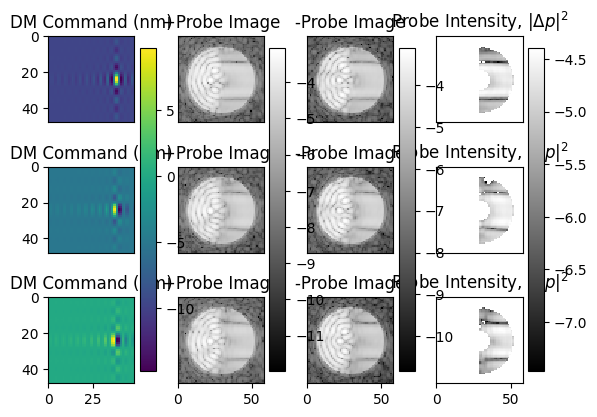

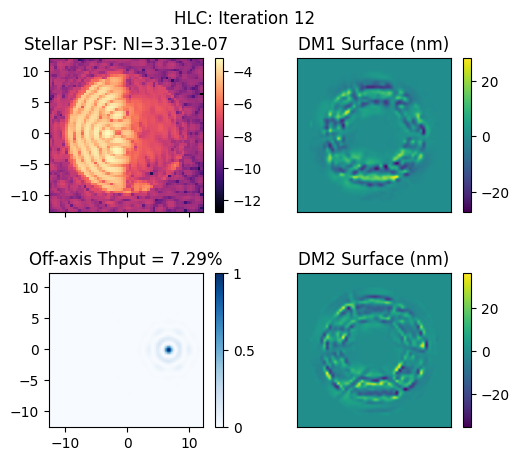

Complex projection of deltaE is 0.74    for subband 0/0
Complex correlation of deltaE is 0.21    for subband 0/0
Using the Jacobian to make other matrices...done.
Control beginning ...
Scaling factor:		0.50		0.50		0.50		0.50		0.50		0.50		0.50		0.50		
log10reg:    		-6.0		-5.5		-5.0		-4.5		-4.0		-3.5		-3.0		-2.5		
Inorm:       		6.15e-05	9.23e-06	1.96e-06	5.22e-07	2.45e-07	1.88e-07	1.79e-07	1.80e-07	
Model-based grid search expects log10reg, = -3.0,	 dmfac = 0.50,	 1.79e-07 normalized intensity.
 DM1 P-V in volts: 53.916
 DM2 P-V in volts: 70.838
RMS surface of DM1 = 6.0 nm
RMS surface of DM2 = 7.3 nm
Previous Measured NI:			 3.31e-07 
Saving data snippet to:
	/home/u21/kianmilani/Documents/falco-python/data/brief/hlc_575_test_snippet.pkl  ...done.

Iteration: 13 / 29
Zernike modes (Noll indexing) used in this Jacobian:	[1]
DMs to be used in this iteration = [ 1 2 ]


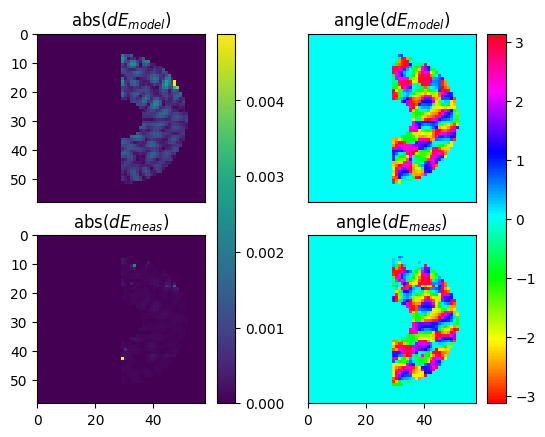

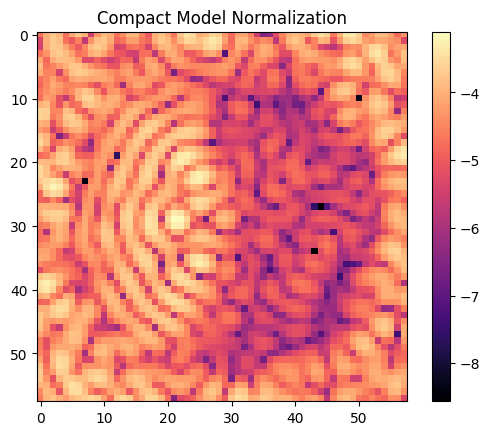

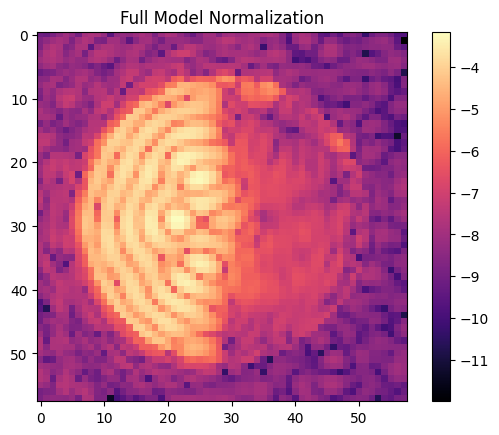

Core throughput within the half-max isophote(s) = 7.27% 	at separation = (-7.0, 0.0) lambda0/D.
Estimating electric field with batch process estimation ...
Wavelength: 0/0 ... 
Mode: 0/0 ... 
Measured unprobed Inorm (Corr / Score): 3.15e-07 	2.73e-07
Chosen probe intensity: 1.14e-05
Actual Probe 0+ Contrast is: 1.76e-05
Actual Probe 0- Contrast is: 1.76e-05
Actual Probe 1+ Contrast is: 1.50e-05
Actual Probe 1- Contrast is: 1.48e-05
Actual Probe 2+ Contrast is: 1.18e-05
Actual Probe 2- Contrast is: 1.18e-05
*** Mean measured Inorm for probe #0  =	1.730e-05
*** Mean measured Inorm for probe #1  =	1.459e-05
*** Mean measured Inorm for probe #2  =	1.150e-05
28 of 730 pixels were given zero probe amplitude.
Completed pairwise probing estimation.


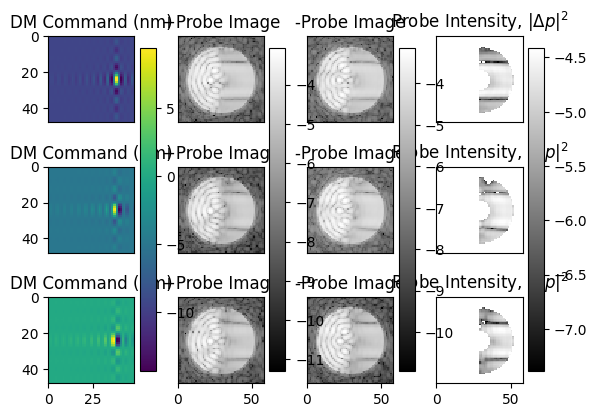

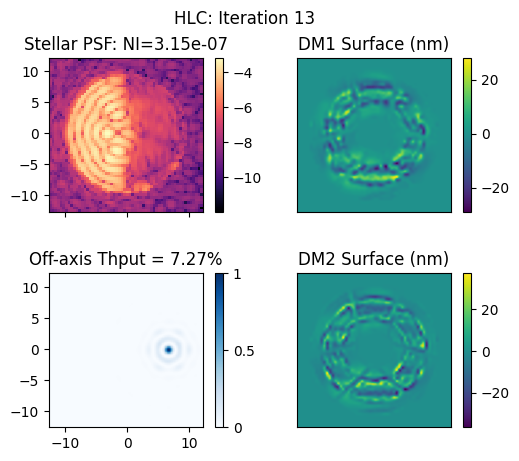

Complex projection of deltaE is 1.26    for subband 0/0
Complex correlation of deltaE is 0.31    for subband 0/0
Using the Jacobian to make other matrices...done.
Control beginning ...
Scaling factor:		0.50		0.50		0.50		0.50		0.50		0.50		0.50		0.50		
log10reg:    		-6.0		-5.5		-5.0		-4.5		-4.0		-3.5		-3.0		-2.5		
Inorm:       		2.01e-04	2.39e-05	3.41e-06	8.41e-07	4.24e-07	3.26e-07	3.04e-07	3.01e-07	
Model-based grid search expects log10reg, = -2.5,	 dmfac = 0.50,	 3.01e-07 normalized intensity.
 DM1 P-V in volts: 54.164
 DM2 P-V in volts: 71.837
RMS surface of DM1 = 6.1 nm
RMS surface of DM2 = 7.4 nm
Previous Measured NI:			 3.15e-07 
Saving data snippet to:
	/home/u21/kianmilani/Documents/falco-python/data/brief/hlc_575_test_snippet.pkl  ...done.

Iteration: 14 / 29
Zernike modes (Noll indexing) used in this Jacobian:	[1]
DMs to be used in this iteration = [ 1 2 ]


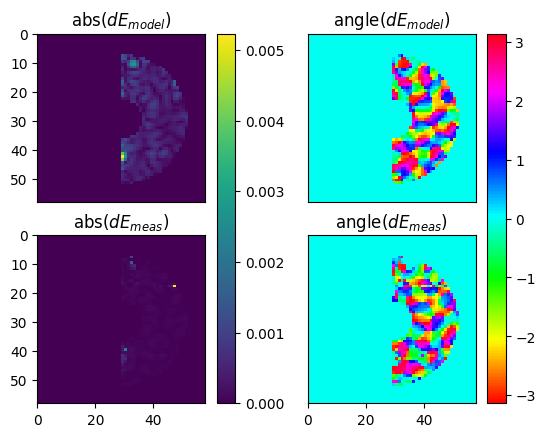

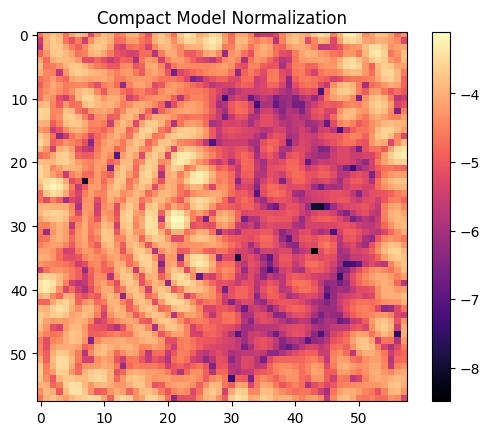

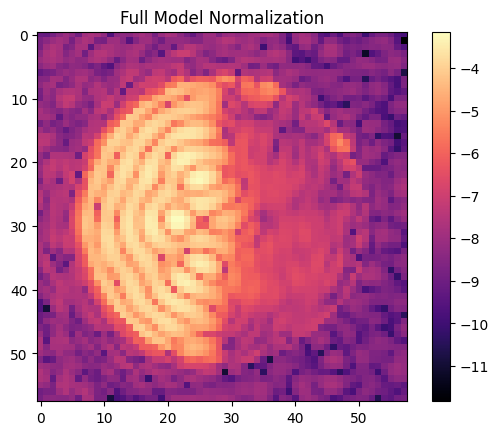

Core throughput within the half-max isophote(s) = 7.26% 	at separation = (-7.0, 0.0) lambda0/D.
Estimating electric field with batch process estimation ...
Wavelength: 0/0 ... 
Mode: 0/0 ... 
Measured unprobed Inorm (Corr / Score): 3.16e-07 	2.65e-07
Chosen probe intensity: 1.11e-05
Actual Probe 0+ Contrast is: 1.71e-05
Actual Probe 0- Contrast is: 1.71e-05
Actual Probe 1+ Contrast is: 1.45e-05
Actual Probe 1- Contrast is: 1.43e-05
Actual Probe 2+ Contrast is: 1.15e-05
Actual Probe 2- Contrast is: 1.16e-05
*** Mean measured Inorm for probe #0  =	1.679e-05
*** Mean measured Inorm for probe #1  =	1.413e-05
*** Mean measured Inorm for probe #2  =	1.123e-05
29 of 730 pixels were given zero probe amplitude.
Completed pairwise probing estimation.


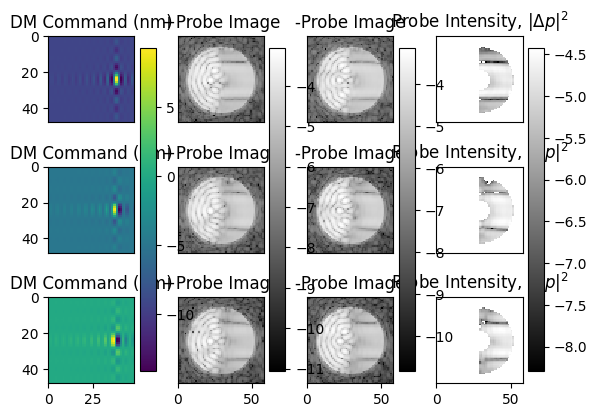

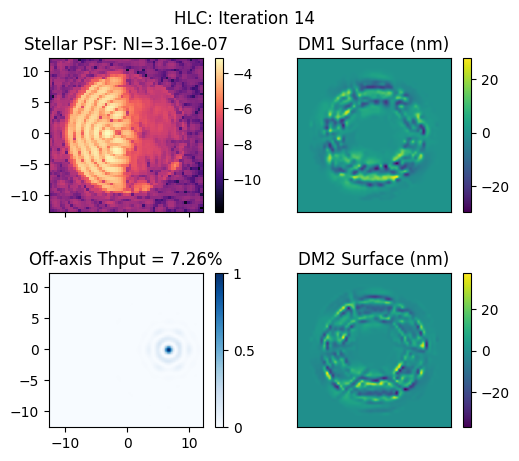

Complex projection of deltaE is 2.47    for subband 0/0
Complex correlation of deltaE is 0.47    for subband 0/0
Using the Jacobian to make other matrices...done.
Control beginning ...
Scaling factor:		0.50		0.50		0.50		0.50		0.50		0.50		0.50		0.50		
log10reg:    		-6.0		-5.5		-5.0		-4.5		-4.0		-3.5		-3.0		-2.5		
Inorm:       		5.03e-05	6.96e-06	1.48e-06	4.82e-07	2.78e-07	2.21e-07	2.07e-07	2.05e-07	
Model-based grid search expects log10reg, = -2.5,	 dmfac = 0.50,	 2.05e-07 normalized intensity.
 DM1 P-V in volts: 54.093
 DM2 P-V in volts: 72.384
RMS surface of DM1 = 6.1 nm
RMS surface of DM2 = 7.4 nm
Previous Measured NI:			 3.16e-07 
Saving data snippet to:
	/home/u21/kianmilani/Documents/falco-python/data/brief/hlc_575_test_snippet.pkl  ...done.

Iteration: 15 / 29
Zernike modes (Noll indexing) used in this Jacobian:	[1]
DMs to be used in this iteration = [ 1 2 ]


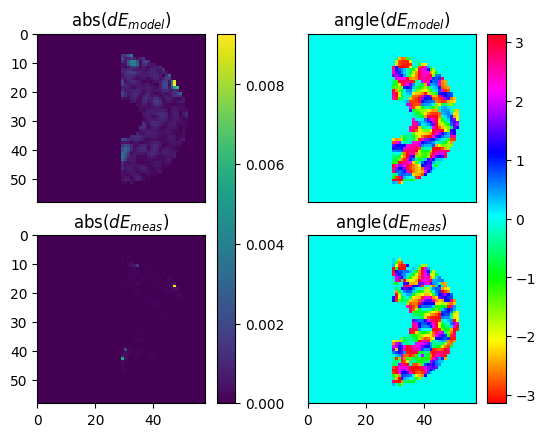

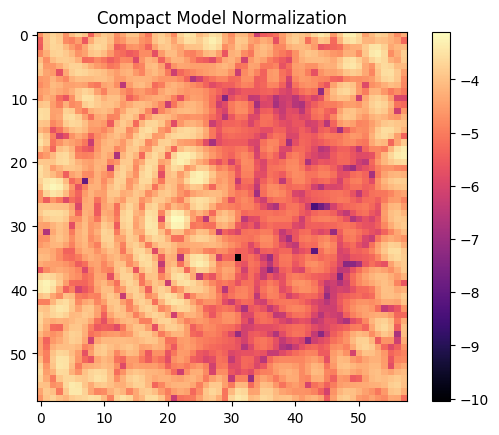

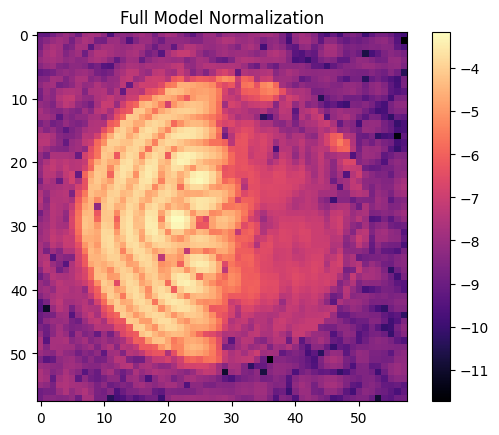

Core throughput within the half-max isophote(s) = 7.26% 	at separation = (-7.0, 0.0) lambda0/D.
Computing control Jacobian matrices in parallel...done.
Elapsed: 24.572811603546143
Estimating electric field with batch process estimation ...
Wavelength: 0/0 ... 
Mode: 0/0 ... 
Measured unprobed Inorm (Corr / Score): 2.95e-07 	2.56e-07
Chosen probe intensity: 1.07e-05
Actual Probe 0+ Contrast is: 1.66e-05
Actual Probe 0- Contrast is: 1.66e-05
Actual Probe 1+ Contrast is: 1.41e-05
Actual Probe 1- Contrast is: 1.39e-05
Actual Probe 2+ Contrast is: 1.12e-05
Actual Probe 2- Contrast is: 1.12e-05
*** Mean measured Inorm for probe #0  =	1.630e-05
*** Mean measured Inorm for probe #1  =	1.369e-05
*** Mean measured Inorm for probe #2  =	1.090e-05
26 of 730 pixels were given zero probe amplitude.
Completed pairwise probing estimation.


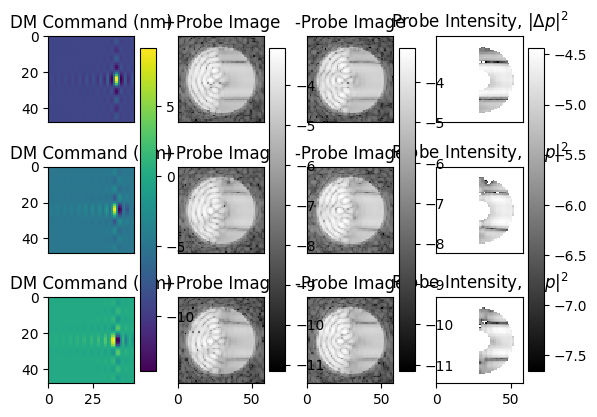

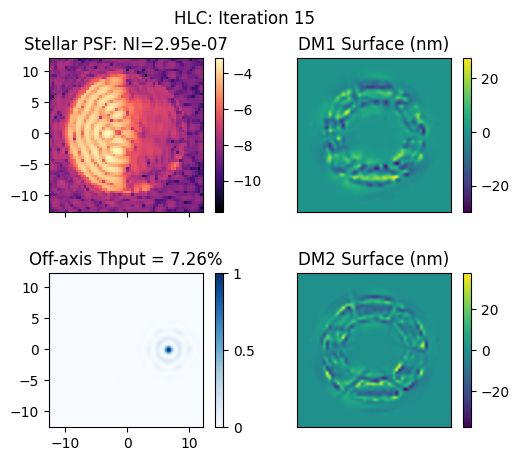

Complex projection of deltaE is 1.05    for subband 0/0
Complex correlation of deltaE is 0.23    for subband 0/0
Using the Jacobian to make other matrices...done.
Control beginning ...
Scaling factor:		0.50		0.50		0.50		0.50		0.50		0.50		0.50		0.50		
log10reg:    		-6.0		-5.5		-5.0		-4.5		-4.0		-3.5		-3.0		-2.5		
Inorm:       		2.83e-04	2.69e-05	3.62e-06	7.48e-07	4.91e-07	4.58e-07	4.60e-07	4.64e-07	
Model-based grid search expects log10reg, = -3.5,	 dmfac = 0.50,	 4.58e-07 normalized intensity.
 DM1 P-V in volts: 57.382
 DM2 P-V in volts: 75.744
RMS surface of DM1 = 6.4 nm
RMS surface of DM2 = 7.7 nm
Previous Measured NI:			 2.95e-07 
Saving data snippet to:
	/home/u21/kianmilani/Documents/falco-python/data/brief/hlc_575_test_snippet.pkl  ...done.

Iteration: 16 / 29
Zernike modes (Noll indexing) used in this Jacobian:	[1]
DMs to be used in this iteration = [ 1 2 ]


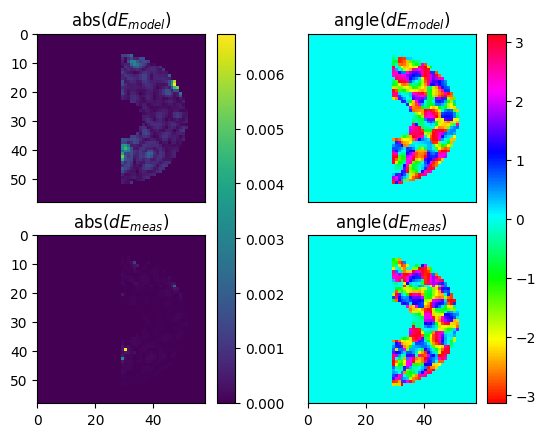

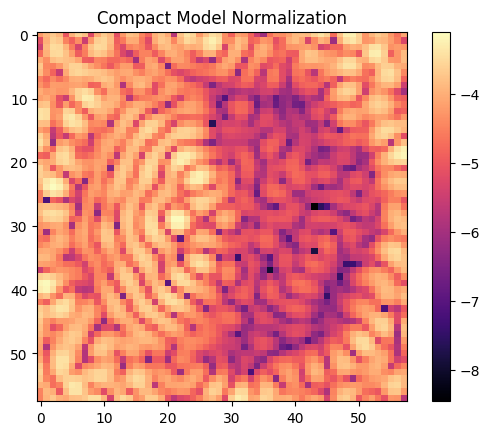

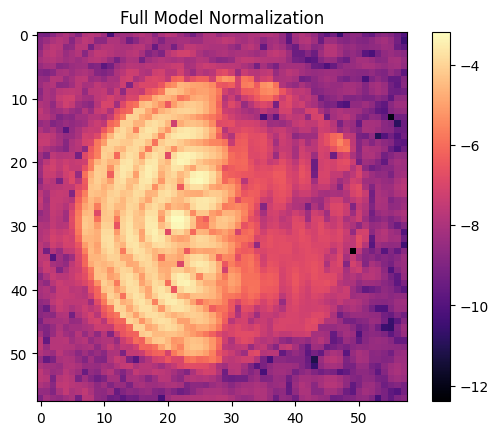

Core throughput within the half-max isophote(s) = 7.20% 	at separation = (-7.0, 0.0) lambda0/D.
Estimating electric field with batch process estimation ...
Wavelength: 0/0 ... 
Mode: 0/0 ... 
Measured unprobed Inorm (Corr / Score): 3.38e-07 	3.08e-07
Chosen probe intensity: 1.07e-05
Actual Probe 0+ Contrast is: 1.63e-05
Actual Probe 0- Contrast is: 1.67e-05
Actual Probe 1+ Contrast is: 1.39e-05
Actual Probe 1- Contrast is: 1.39e-05
Actual Probe 2+ Contrast is: 1.13e-05
Actual Probe 2- Contrast is: 1.12e-05
*** Mean measured Inorm for probe #0  =	1.613e-05
*** Mean measured Inorm for probe #1  =	1.360e-05
*** Mean measured Inorm for probe #2  =	1.092e-05
24 of 730 pixels were given zero probe amplitude.
Completed pairwise probing estimation.


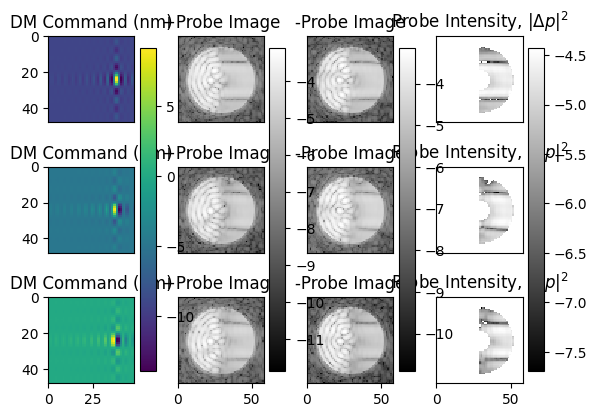

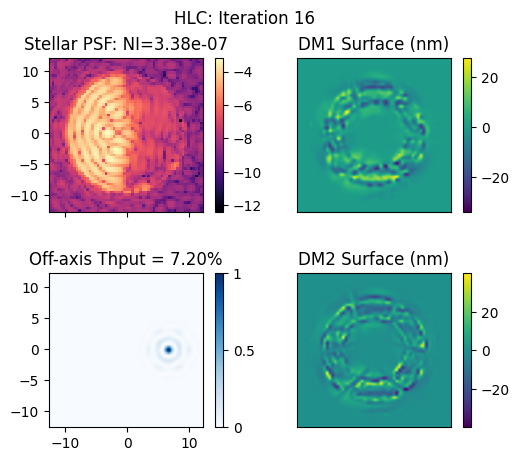

Complex projection of deltaE is 15.44    for subband 0/0
Complex correlation of deltaE is 0.55    for subband 0/0
Using the Jacobian to make other matrices...done.
Control beginning ...
Scaling factor:		0.50		0.50		0.50		0.50		0.50		0.50		0.50		0.50		
log10reg:    		-6.0		-5.5		-5.0		-4.5		-4.0		-3.5		-3.0		-2.5		
Inorm:       		1.12e-03	4.17e-04	5.97e-05	9.21e-06	2.93e-06	2.28e-06	2.24e-06	2.27e-06	
Model-based grid search expects log10reg, = -3.0,	 dmfac = 0.50,	 2.24e-06 normalized intensity.
 DM1 P-V in volts: 53.318
 DM2 P-V in volts: 75.947
RMS surface of DM1 = 6.2 nm
RMS surface of DM2 = 7.6 nm
Previous Measured NI:			 3.38e-07 
Saving data snippet to:
	/home/u21/kianmilani/Documents/falco-python/data/brief/hlc_575_test_snippet.pkl  ...done.

Iteration: 17 / 29
Zernike modes (Noll indexing) used in this Jacobian:	[1]
DMs to be used in this iteration = [ 1 2 ]


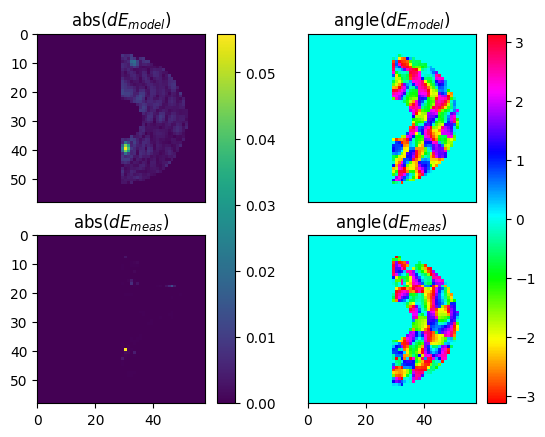

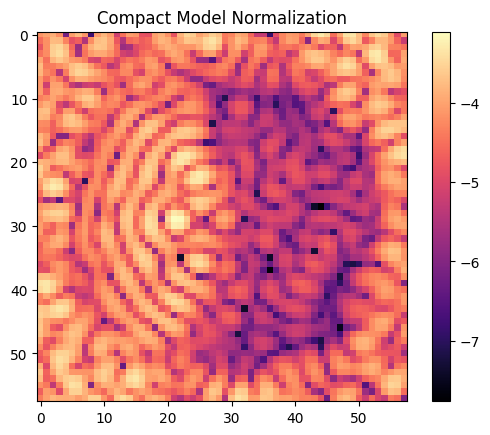

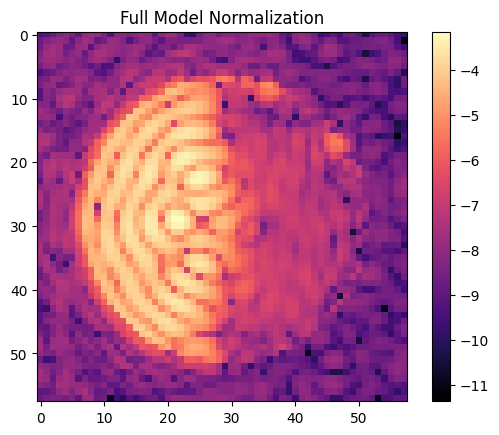

Core throughput within the half-max isophote(s) = 7.25% 	at separation = (-7.0, 0.0) lambda0/D.
Estimating electric field with batch process estimation ...
Wavelength: 0/0 ... 
Mode: 0/0 ... 
Measured unprobed Inorm (Corr / Score): 2.59e-07 	2.15e-07
Chosen probe intensity: 9.81e-06
Actual Probe 0+ Contrast is: 1.51e-05
Actual Probe 0- Contrast is: 1.52e-05
Actual Probe 1+ Contrast is: 1.30e-05
Actual Probe 1- Contrast is: 1.26e-05
Actual Probe 2+ Contrast is: 1.03e-05
Actual Probe 2- Contrast is: 1.01e-05
*** Mean measured Inorm for probe #0  =	1.489e-05
*** Mean measured Inorm for probe #1  =	1.257e-05
*** Mean measured Inorm for probe #2  =	9.935e-06
22 of 730 pixels were given zero probe amplitude.
Completed pairwise probing estimation.


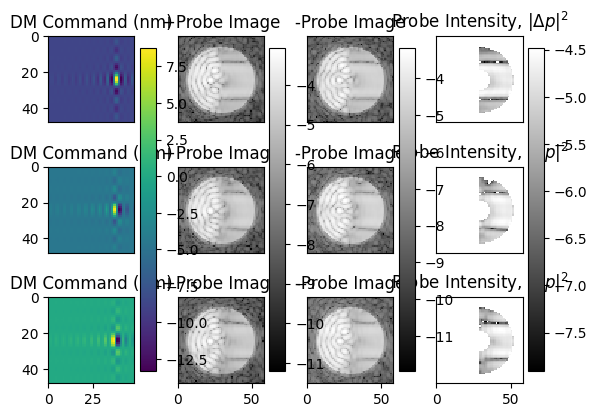

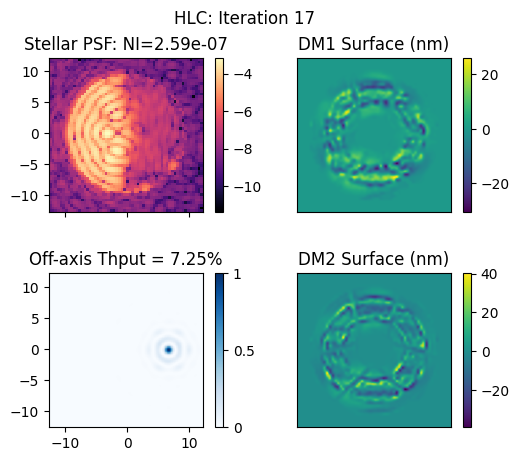

Complex projection of deltaE is 3.26    for subband 0/0
Complex correlation of deltaE is 0.54    for subband 0/0
Using the Jacobian to make other matrices...done.
Control beginning ...
Scaling factor:		0.50		0.50		0.50		0.50		0.50		0.50		0.50		0.50		
log10reg:    		-6.0		-5.5		-5.0		-4.5		-4.0		-3.5		-3.0		-2.5		
Inorm:       		1.10e-04	1.07e-05	1.67e-06	5.42e-07	4.11e-07	3.91e-07	3.96e-07	4.05e-07	
Model-based grid search expects log10reg, = -3.5,	 dmfac = 0.50,	 3.91e-07 normalized intensity.
 DM1 P-V in volts: 53.964
 DM2 P-V in volts: 76.014
RMS surface of DM1 = 6.4 nm
RMS surface of DM2 = 7.7 nm
Previous Measured NI:			 2.59e-07 
Saving data snippet to:
	/home/u21/kianmilani/Documents/falco-python/data/brief/hlc_575_test_snippet.pkl  ...done.

Iteration: 18 / 29
Zernike modes (Noll indexing) used in this Jacobian:	[1]
DMs to be used in this iteration = [ 1 2 ]


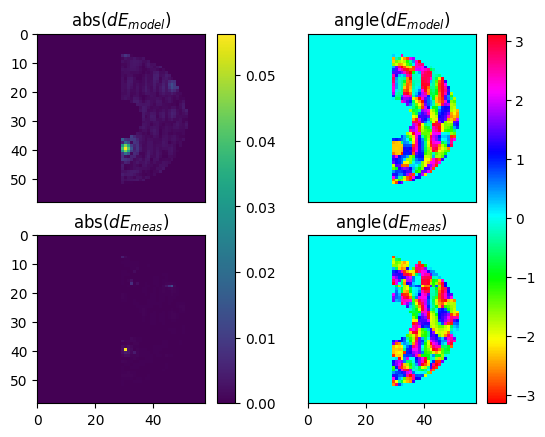

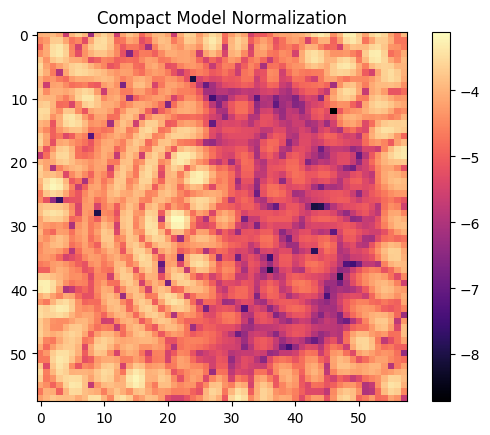

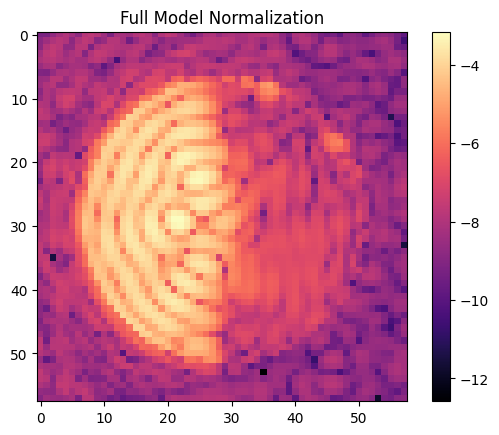

Core throughput within the half-max isophote(s) = 7.26% 	at separation = (-7.0, 0.0) lambda0/D.
Estimating electric field with batch process estimation ...
Wavelength: 0/0 ... 
Mode: 0/0 ... 
Measured unprobed Inorm (Corr / Score): 2.19e-07 	1.93e-07
Chosen probe intensity: 8.82e-06
Actual Probe 0+ Contrast is: 1.35e-05
Actual Probe 0- Contrast is: 1.35e-05
Actual Probe 1+ Contrast is: 1.16e-05
Actual Probe 1- Contrast is: 1.13e-05
Actual Probe 2+ Contrast is: 9.28e-06
Actual Probe 2- Contrast is: 9.19e-06
*** Mean measured Inorm for probe #0  =	1.333e-05
*** Mean measured Inorm for probe #1  =	1.124e-05
*** Mean measured Inorm for probe #2  =	9.015e-06
18 of 730 pixels were given zero probe amplitude.
Completed pairwise probing estimation.


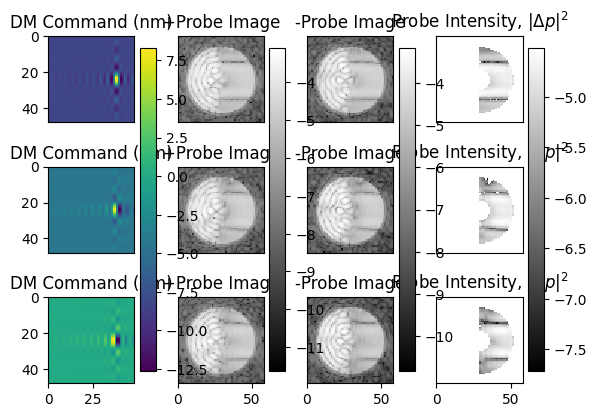

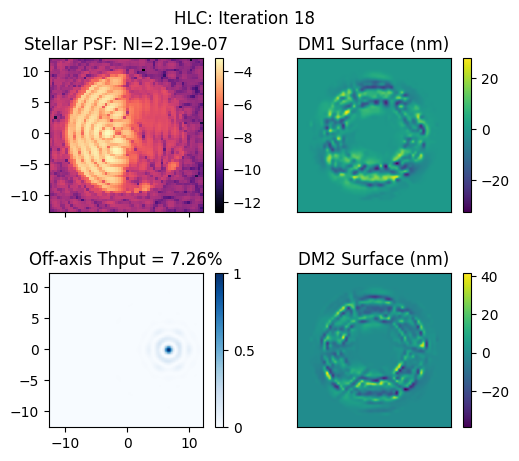

Complex projection of deltaE is 2.80    for subband 0/0
Complex correlation of deltaE is 0.56    for subband 0/0
Using the Jacobian to make other matrices...done.
Control beginning ...
Scaling factor:		0.50		0.50		0.50		0.50		0.50		0.50		0.50		0.50		
log10reg:    		-6.0		-5.5		-5.0		-4.5		-4.0		-3.5		-3.0		-2.5		
Inorm:       		2.77e-05	3.51e-06	7.96e-07	3.73e-07	2.88e-07	2.69e-07	2.68e-07	2.72e-07	
Model-based grid search expects log10reg, = -3.0,	 dmfac = 0.50,	 2.68e-07 normalized intensity.
 DM1 P-V in volts: 53.018
 DM2 P-V in volts: 74.447
RMS surface of DM1 = 6.3 nm
RMS surface of DM2 = 7.6 nm
Previous Measured NI:			 2.19e-07 
Saving data snippet to:
	/home/u21/kianmilani/Documents/falco-python/data/brief/hlc_575_test_snippet.pkl  ...done.

Iteration: 19 / 29
Zernike modes (Noll indexing) used in this Jacobian:	[1]
DMs to be used in this iteration = [ 1 2 ]


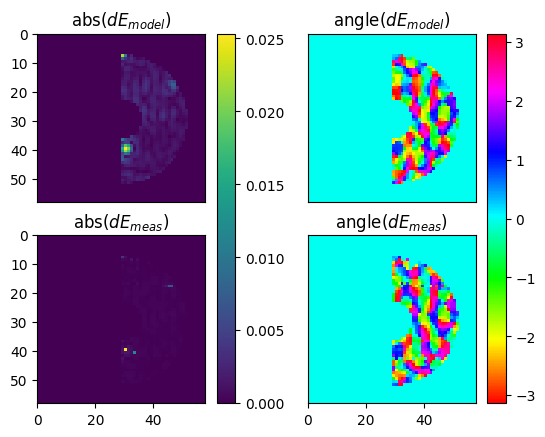

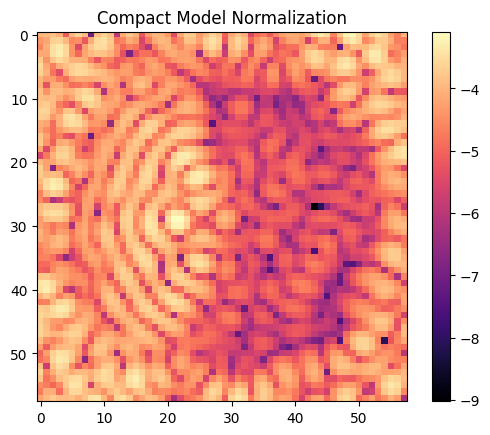

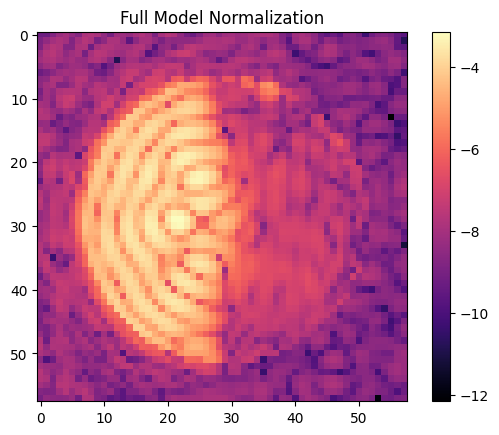

Core throughput within the half-max isophote(s) = 7.28% 	at separation = (-7.0, 0.0) lambda0/D.
Estimating electric field with batch process estimation ...
Wavelength: 0/0 ... 
Mode: 0/0 ... 
Measured unprobed Inorm (Corr / Score): 1.53e-07 	1.33e-07
Chosen probe intensity: 8.72e-06
Actual Probe 0+ Contrast is: 1.34e-05
Actual Probe 0- Contrast is: 1.34e-05
Actual Probe 1+ Contrast is: 1.13e-05
Actual Probe 1- Contrast is: 1.11e-05
Actual Probe 2+ Contrast is: 8.96e-06
Actual Probe 2- Contrast is: 9.00e-06
*** Mean measured Inorm for probe #0  =	1.322e-05
*** Mean measured Inorm for probe #1  =	1.104e-05
*** Mean measured Inorm for probe #2  =	8.828e-06
17 of 730 pixels were given zero probe amplitude.
Completed pairwise probing estimation.


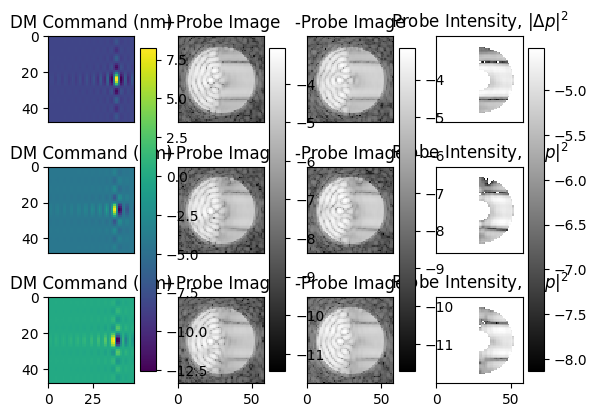

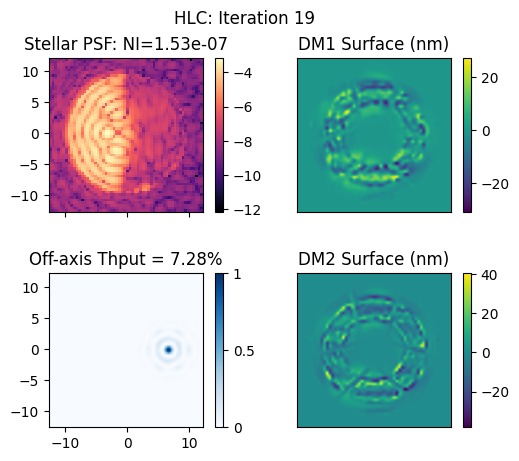

Complex projection of deltaE is 0.62    for subband 0/0
Complex correlation of deltaE is 0.24    for subband 0/0
Using the Jacobian to make other matrices...done.
Control beginning ...
Scaling factor:		0.50		0.50		0.50		0.50		0.50		0.50		0.50		0.50		
log10reg:    		-6.0		-5.5		-5.0		-4.5		-4.0		-3.5		-3.0		-2.5		
Inorm:       		3.43e-05	4.64e-06	1.36e-06	6.27e-07	4.74e-07	4.40e-07	4.36e-07	4.38e-07	
Model-based grid search expects log10reg, = -3.0,	 dmfac = 0.50,	 4.36e-07 normalized intensity.
 DM1 P-V in volts: 51.814
 DM2 P-V in volts: 73.171
RMS surface of DM1 = 6.3 nm
RMS surface of DM2 = 7.6 nm
Previous Measured NI:			 1.53e-07 
Saving data snippet to:
	/home/u21/kianmilani/Documents/falco-python/data/brief/hlc_575_test_snippet.pkl  ...done.

Iteration: 20 / 29
Zernike modes (Noll indexing) used in this Jacobian:	[1]
DMs to be used in this iteration = [ 1 2 ]


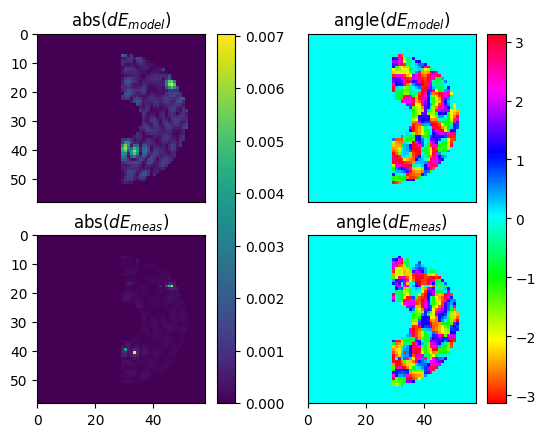

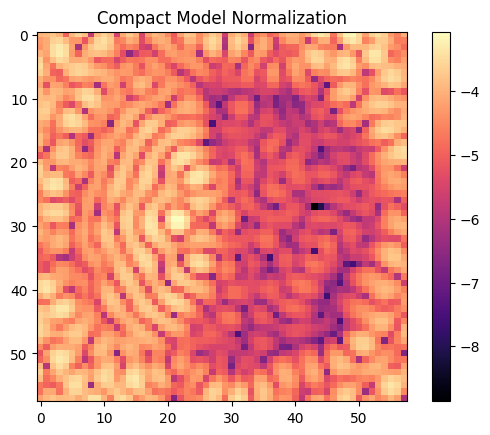

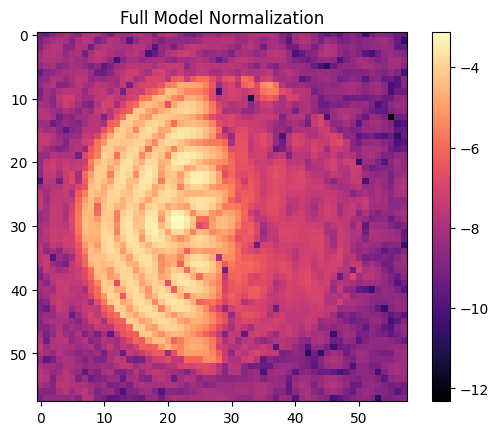

Core throughput within the half-max isophote(s) = 7.29% 	at separation = (-7.0, 0.0) lambda0/D.
Computing control Jacobian matrices in parallel...done.
Elapsed: 24.4782292842865
Estimating electric field with batch process estimation ...
Wavelength: 0/0 ... 
Mode: 0/0 ... 
Measured unprobed Inorm (Corr / Score): 1.43e-07 	1.28e-07
Chosen probe intensity: 8.41e-06
Actual Probe 0+ Contrast is: 1.28e-05
Actual Probe 0- Contrast is: 1.29e-05
Actual Probe 1+ Contrast is: 1.08e-05
Actual Probe 1- Contrast is: 1.06e-05
Actual Probe 2+ Contrast is: 8.65e-06
Actual Probe 2- Contrast is: 8.66e-06
*** Mean measured Inorm for probe #0  =	1.273e-05
*** Mean measured Inorm for probe #1  =	1.059e-05
*** Mean measured Inorm for probe #2  =	8.514e-06
16 of 730 pixels were given zero probe amplitude.
Completed pairwise probing estimation.


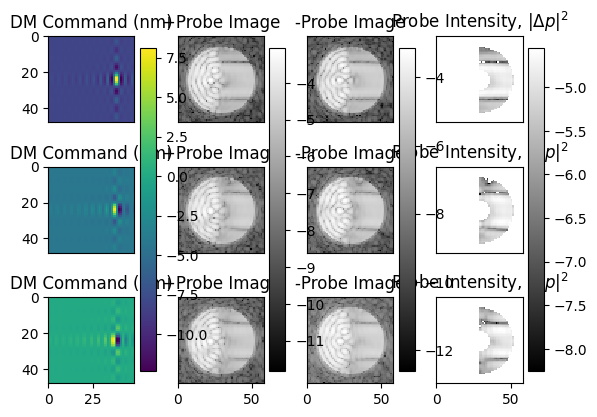

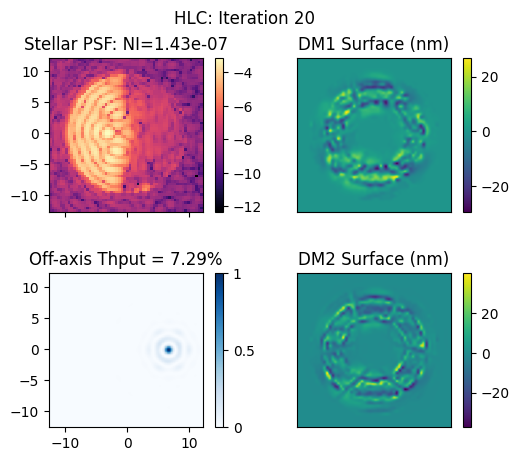

Complex projection of deltaE is 1.43    for subband 0/0
Complex correlation of deltaE is 0.57    for subband 0/0
Using the Jacobian to make other matrices...done.
Control beginning ...
Scaling factor:		0.50		0.50		0.50		0.50		0.50		0.50		0.50		0.50		
log10reg:    		-6.0		-5.5		-5.0		-4.5		-4.0		-3.5		-3.0		-2.5		
Inorm:       		1.26e-05	1.56e-06	5.12e-07	2.71e-07	2.31e-07	2.27e-07	2.29e-07	2.32e-07	
Model-based grid search expects log10reg, = -3.5,	 dmfac = 0.50,	 2.27e-07 normalized intensity.
 DM1 P-V in volts: 50.088
 DM2 P-V in volts: 73.251
RMS surface of DM1 = 6.3 nm
RMS surface of DM2 = 7.7 nm
Previous Measured NI:			 1.43e-07 
Saving data snippet to:
	/home/u21/kianmilani/Documents/falco-python/data/brief/hlc_575_test_snippet.pkl  ...done.

Iteration: 21 / 29
Zernike modes (Noll indexing) used in this Jacobian:	[1]
DMs to be used in this iteration = [ 1 2 ]


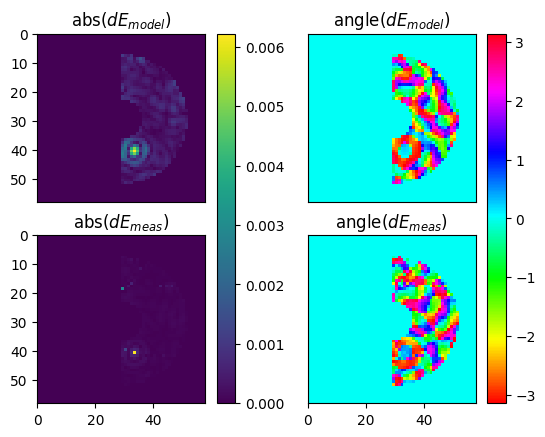

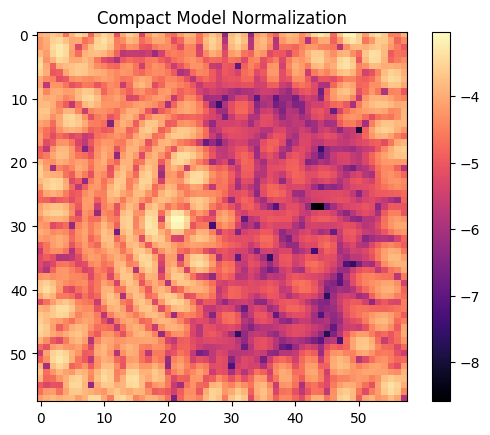

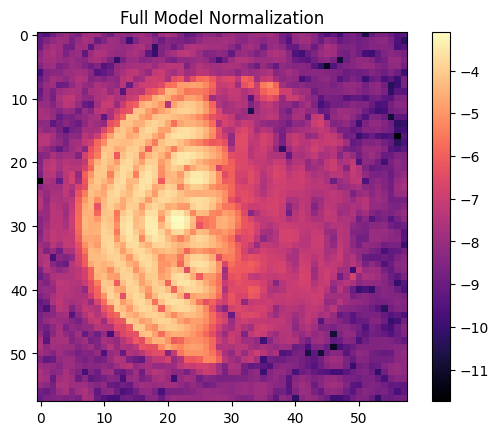

Core throughput within the half-max isophote(s) = 7.28% 	at separation = (-7.0, 0.0) lambda0/D.
Estimating electric field with batch process estimation ...
Wavelength: 0/0 ... 
Mode: 0/0 ... 
Measured unprobed Inorm (Corr / Score): 1.30e-07 	1.16e-07
Chosen probe intensity: 8.32e-06
Actual Probe 0+ Contrast is: 1.26e-05
Actual Probe 0- Contrast is: 1.27e-05
Actual Probe 1+ Contrast is: 1.05e-05
Actual Probe 1- Contrast is: 1.05e-05
Actual Probe 2+ Contrast is: 8.57e-06
Actual Probe 2- Contrast is: 8.66e-06
*** Mean measured Inorm for probe #0  =	1.253e-05
*** Mean measured Inorm for probe #1  =	1.037e-05
*** Mean measured Inorm for probe #2  =	8.485e-06
14 of 730 pixels were given zero probe amplitude.
Completed pairwise probing estimation.


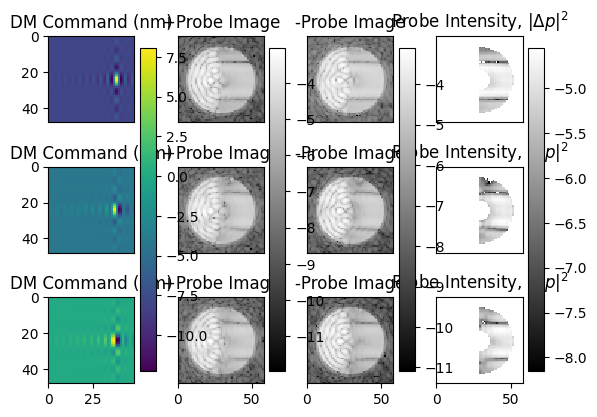

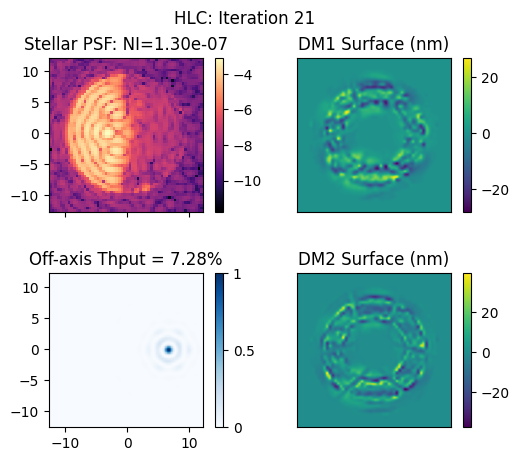

Complex projection of deltaE is 2.73    for subband 0/0
Complex correlation of deltaE is 0.37    for subband 0/0
Using the Jacobian to make other matrices...done.
Control beginning ...
Scaling factor:		0.50		0.50		0.50		0.50		0.50		0.50		0.50		0.50		
log10reg:    		-6.0		-5.5		-5.0		-4.5		-4.0		-3.5		-3.0		-2.5		
Inorm:       		6.61e-06	1.10e-06	2.53e-07	1.00e-07	7.30e-08	6.80e-08	6.76e-08	6.83e-08	
Model-based grid search expects log10reg, = -3.0,	 dmfac = 0.50,	 6.76e-08 normalized intensity.
 DM1 P-V in volts: 50.218
 DM2 P-V in volts: 73.921
RMS surface of DM1 = 6.3 nm
RMS surface of DM2 = 7.7 nm
Previous Measured NI:			 1.30e-07 
Saving data snippet to:
	/home/u21/kianmilani/Documents/falco-python/data/brief/hlc_575_test_snippet.pkl  ...done.

Iteration: 22 / 29
Zernike modes (Noll indexing) used in this Jacobian:	[1]
DMs to be used in this iteration = [ 1 2 ]


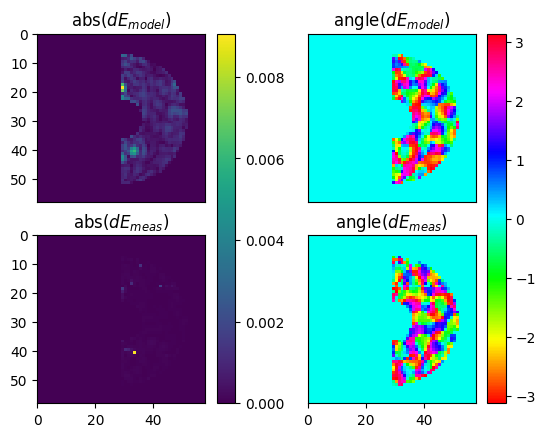

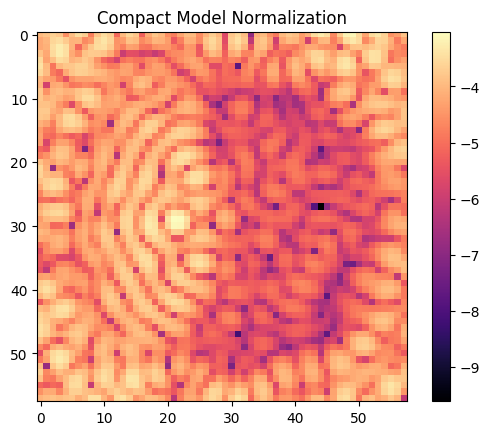

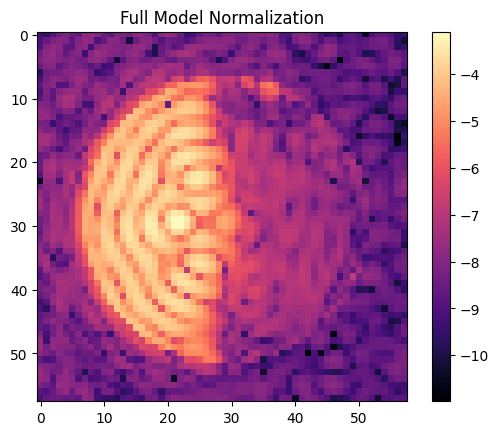

Core throughput within the half-max isophote(s) = 7.28% 	at separation = (-7.0, 0.0) lambda0/D.
Estimating electric field with batch process estimation ...
Wavelength: 0/0 ... 
Mode: 0/0 ... 
Measured unprobed Inorm (Corr / Score): 1.16e-07 	1.03e-07
Chosen probe intensity: 8.22e-06
Actual Probe 0+ Contrast is: 1.25e-05
Actual Probe 0- Contrast is: 1.25e-05
Actual Probe 1+ Contrast is: 1.04e-05
Actual Probe 1- Contrast is: 1.03e-05
Actual Probe 2+ Contrast is: 8.47e-06
Actual Probe 2- Contrast is: 8.59e-06
*** Mean measured Inorm for probe #0  =	1.239e-05
*** Mean measured Inorm for probe #1  =	1.023e-05
*** Mean measured Inorm for probe #2  =	8.412e-06
14 of 730 pixels were given zero probe amplitude.
Completed pairwise probing estimation.


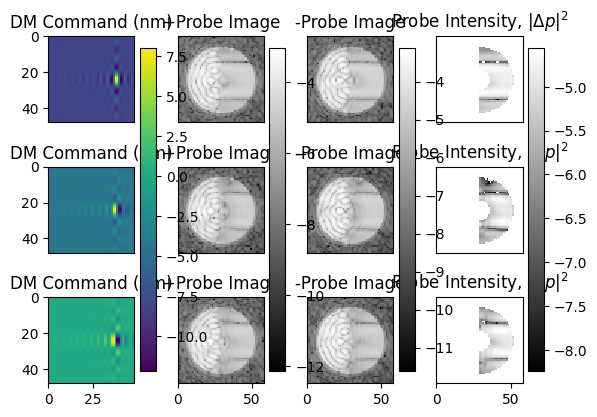

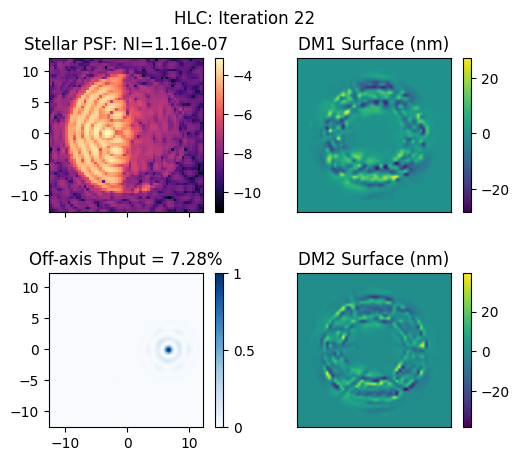

Complex projection of deltaE is 0.48    for subband 0/0
Complex correlation of deltaE is 0.16    for subband 0/0
Using the Jacobian to make other matrices...done.
Control beginning ...
Scaling factor:		0.50		0.50		0.50		0.50		0.50		0.50		0.50		0.50		
log10reg:    		-6.0		-5.5		-5.0		-4.5		-4.0		-3.5		-3.0		-2.5		
Inorm:       		6.16e-06	1.08e-06	2.58e-07	9.28e-08	6.09e-08	5.47e-08	5.38e-08	5.41e-08	
Model-based grid search expects log10reg, = -3.0,	 dmfac = 0.50,	 5.38e-08 normalized intensity.
 DM1 P-V in volts: 50.311
 DM2 P-V in volts: 74.382
RMS surface of DM1 = 6.4 nm
RMS surface of DM2 = 7.7 nm
Previous Measured NI:			 1.16e-07 
Saving data snippet to:
	/home/u21/kianmilani/Documents/falco-python/data/brief/hlc_575_test_snippet.pkl  ...done.

Iteration: 23 / 29
Zernike modes (Noll indexing) used in this Jacobian:	[1]
DMs to be used in this iteration = [ 1 2 ]


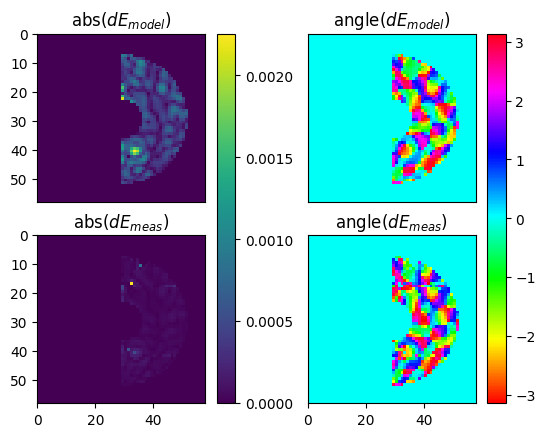

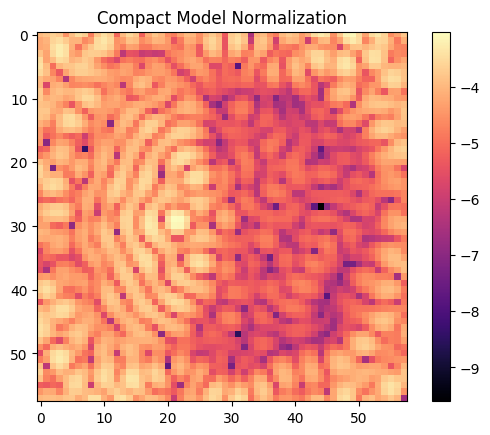

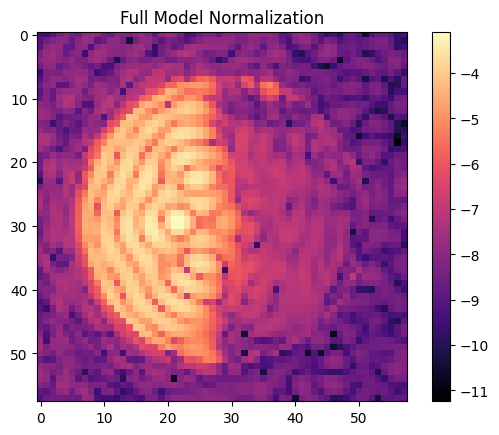

Core throughput within the half-max isophote(s) = 7.28% 	at separation = (-7.0, 0.0) lambda0/D.
Estimating electric field with batch process estimation ...
Wavelength: 0/0 ... 
Mode: 0/0 ... 
Measured unprobed Inorm (Corr / Score): 1.12e-07 	1.00e-07
Chosen probe intensity: 8.10e-06
Actual Probe 0+ Contrast is: 1.23e-05
Actual Probe 0- Contrast is: 1.24e-05
Actual Probe 1+ Contrast is: 1.02e-05
Actual Probe 1- Contrast is: 1.01e-05
Actual Probe 2+ Contrast is: 8.36e-06
Actual Probe 2- Contrast is: 8.49e-06
*** Mean measured Inorm for probe #0  =	1.222e-05
*** Mean measured Inorm for probe #1  =	1.007e-05
*** Mean measured Inorm for probe #2  =	8.310e-06
15 of 730 pixels were given zero probe amplitude.
Completed pairwise probing estimation.


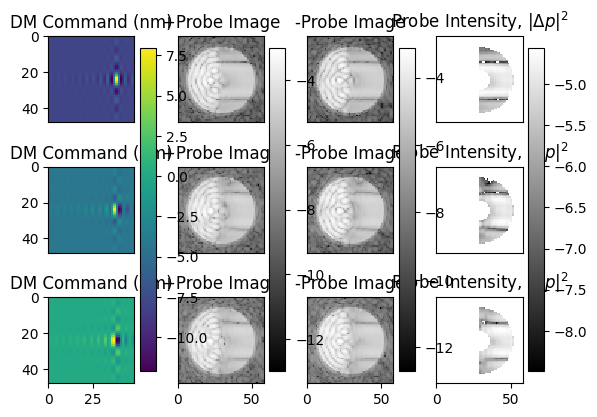

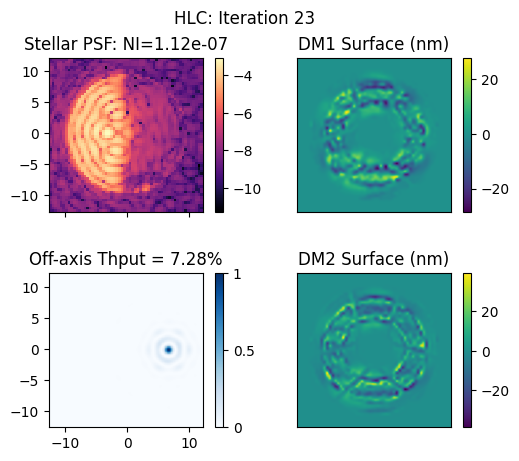

Complex projection of deltaE is 1.06    for subband 0/0
Complex correlation of deltaE is 0.27    for subband 0/0
Using the Jacobian to make other matrices...done.
Control beginning ...
Scaling factor:		0.50		0.50		0.50		0.50		0.50		0.50		0.50		0.50		
log10reg:    		-6.0		-5.5		-5.0		-4.5		-4.0		-3.5		-3.0		-2.5		
Inorm:       		9.54e-06	1.47e-06	3.30e-07	1.17e-07	7.60e-08	6.83e-08	6.72e-08	6.74e-08	
Model-based grid search expects log10reg, = -3.0,	 dmfac = 0.50,	 6.72e-08 normalized intensity.
 DM1 P-V in volts: 50.175
 DM2 P-V in volts: 74.660
RMS surface of DM1 = 6.4 nm
RMS surface of DM2 = 7.7 nm
Previous Measured NI:			 1.12e-07 
Saving data snippet to:
	/home/u21/kianmilani/Documents/falco-python/data/brief/hlc_575_test_snippet.pkl  ...done.

Iteration: 24 / 29
Zernike modes (Noll indexing) used in this Jacobian:	[1]
DMs to be used in this iteration = [ 1 2 ]


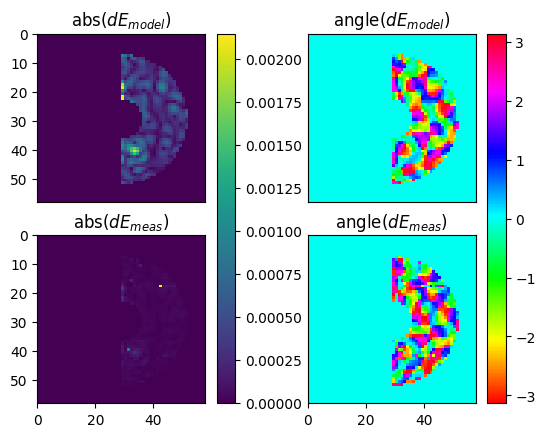

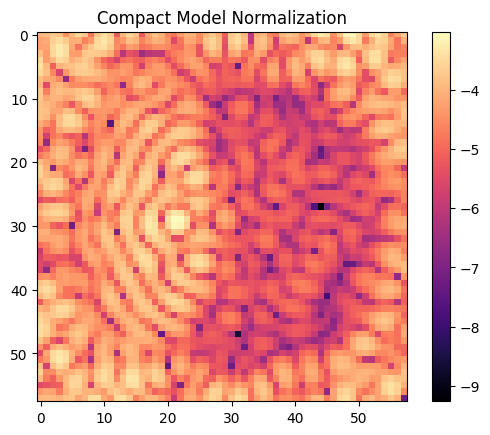

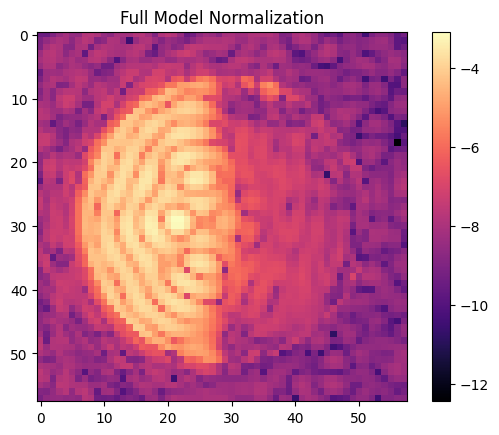

Core throughput within the half-max isophote(s) = 7.28% 	at separation = (-7.0, 0.0) lambda0/D.
Estimating electric field with batch process estimation ...
Wavelength: 0/0 ... 
Mode: 0/0 ... 
Measured unprobed Inorm (Corr / Score): 1.14e-07 	1.05e-07
Chosen probe intensity: 8.00e-06
Actual Probe 0+ Contrast is: 1.21e-05
Actual Probe 0- Contrast is: 1.22e-05
Actual Probe 1+ Contrast is: 1.01e-05
Actual Probe 1- Contrast is: 1.00e-05
Actual Probe 2+ Contrast is: 8.26e-06
Actual Probe 2- Contrast is: 8.39e-06
*** Mean measured Inorm for probe #0  =	1.206e-05
*** Mean measured Inorm for probe #1  =	9.947e-06
*** Mean measured Inorm for probe #2  =	8.208e-06
14 of 730 pixels were given zero probe amplitude.
Completed pairwise probing estimation.


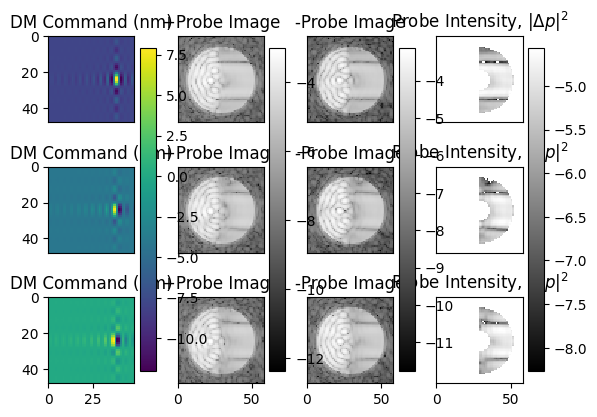

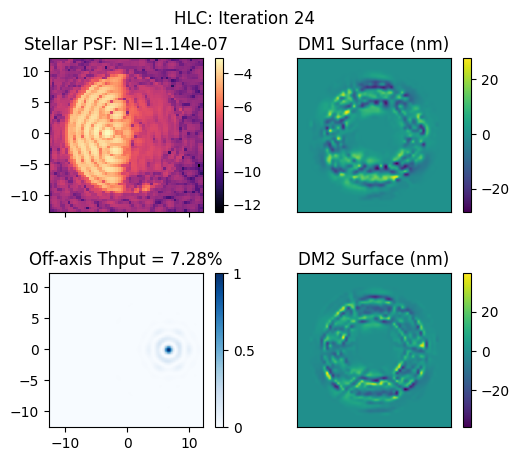

Complex projection of deltaE is 9.02    for subband 0/0
Complex correlation of deltaE is 0.93    for subband 0/0
Using the Jacobian to make other matrices...done.
Control beginning ...
Scaling factor:		0.50		0.50		0.50		0.50		0.50		0.50		0.50		0.50		
log10reg:    		-6.0		-5.5		-5.0		-4.5		-4.0		-3.5		-3.0		-2.5		
Inorm:       		1.16e-05	1.97e-06	4.35e-07	1.37e-07	8.10e-08	7.11e-08	6.94e-08	6.94e-08	
Model-based grid search expects log10reg, = -2.5,	 dmfac = 0.50,	 6.94e-08 normalized intensity.
 DM1 P-V in volts: 50.045
 DM2 P-V in volts: 74.770
RMS surface of DM1 = 6.4 nm
RMS surface of DM2 = 7.8 nm
Previous Measured NI:			 1.14e-07 
Saving data snippet to:
	/home/u21/kianmilani/Documents/falco-python/data/brief/hlc_575_test_snippet.pkl  ...done.

Iteration: 25 / 29
Zernike modes (Noll indexing) used in this Jacobian:	[1]
DMs to be used in this iteration = [ 1 2 ]


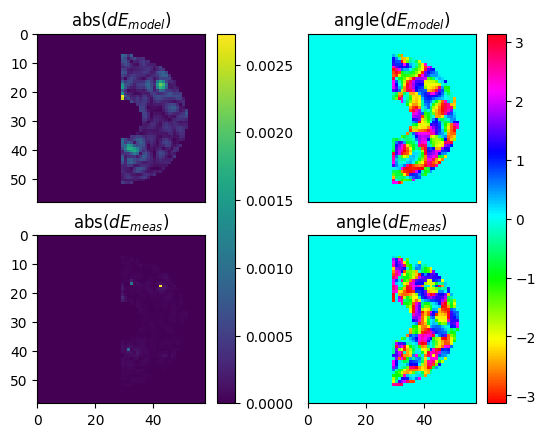

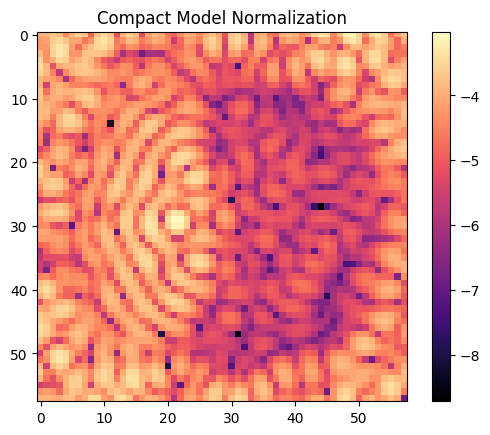

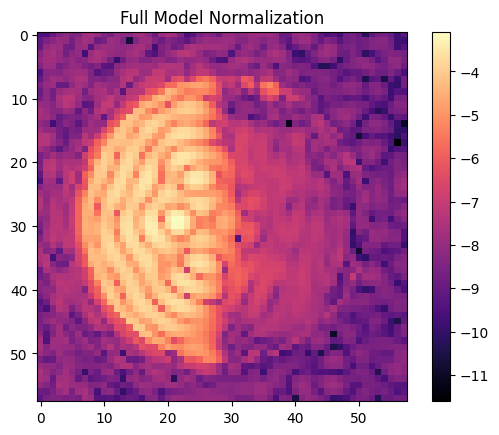

Core throughput within the half-max isophote(s) = 7.28% 	at separation = (-7.0, 0.0) lambda0/D.
Computing control Jacobian matrices in parallel...done.
Elapsed: 24.274491548538208
Estimating electric field with batch process estimation ...
Wavelength: 0/0 ... 
Mode: 0/0 ... 
Measured unprobed Inorm (Corr / Score): 1.18e-07 	1.11e-07
Chosen probe intensity: 7.86e-06
Actual Probe 0+ Contrast is: 1.20e-05
Actual Probe 0- Contrast is: 1.20e-05
Actual Probe 1+ Contrast is: 9.95e-06
Actual Probe 1- Contrast is: 9.86e-06
Actual Probe 2+ Contrast is: 8.14e-06
Actual Probe 2- Contrast is: 8.27e-06
*** Mean measured Inorm for probe #0  =	1.186e-05
*** Mean measured Inorm for probe #1  =	9.786e-06
*** Mean measured Inorm for probe #2  =	8.085e-06
14 of 730 pixels were given zero probe amplitude.
Completed pairwise probing estimation.


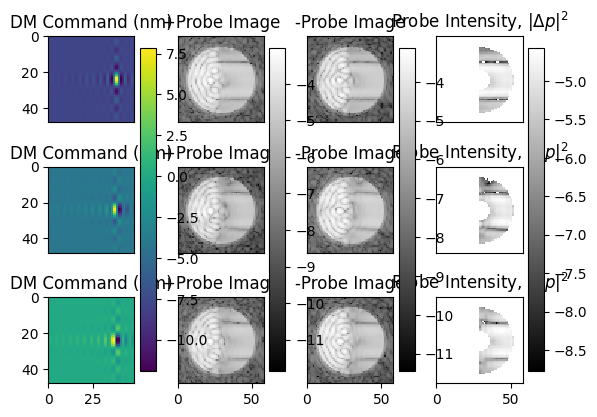

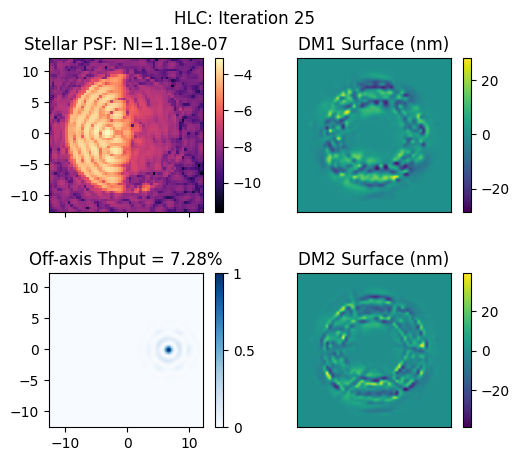

Complex projection of deltaE is 0.28    for subband 0/0
Complex correlation of deltaE is 0.09    for subband 0/0
Using the Jacobian to make other matrices...done.
Control beginning ...
Scaling factor:		0.50		0.50		0.50		0.50		0.50		0.50		0.50		0.50		
log10reg:    		-6.0		-5.5		-5.0		-4.5		-4.0		-3.5		-3.0		-2.5		
Inorm:       		1.27e-05	1.67e-06	2.84e-07	1.08e-07	8.92e-08	8.86e-08	8.98e-08	9.09e-08	
Model-based grid search expects log10reg, = -3.5,	 dmfac = 0.50,	 8.86e-08 normalized intensity.
 DM1 P-V in volts: 50.710
 DM2 P-V in volts: 76.009
RMS surface of DM1 = 6.5 nm
RMS surface of DM2 = 7.9 nm
Previous Measured NI:			 1.18e-07 
Saving data snippet to:
	/home/u21/kianmilani/Documents/falco-python/data/brief/hlc_575_test_snippet.pkl  ...done.

Iteration: 26 / 29
Zernike modes (Noll indexing) used in this Jacobian:	[1]
DMs to be used in this iteration = [ 1 2 ]


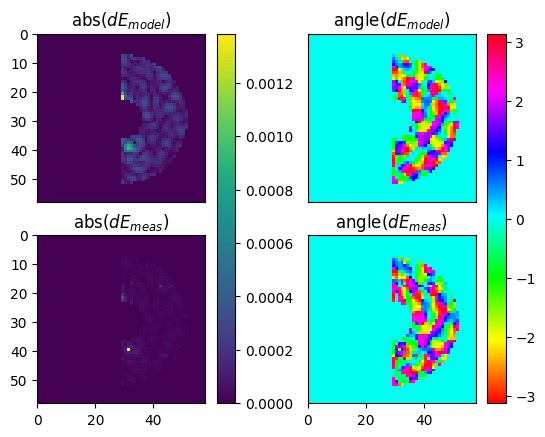

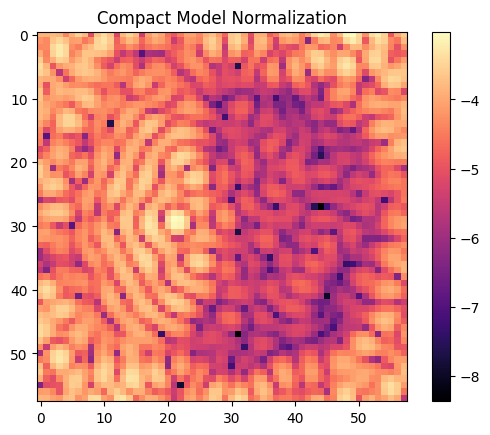

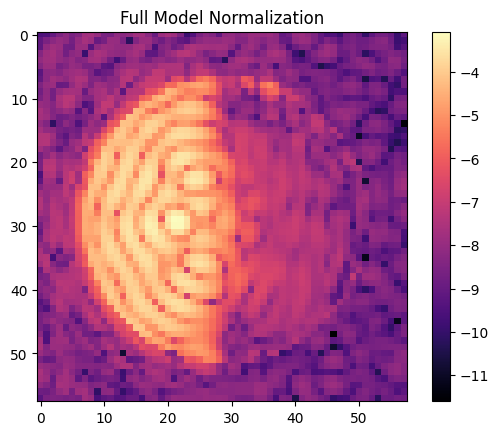

Core throughput within the half-max isophote(s) = 7.26% 	at separation = (-7.0, 0.0) lambda0/D.
Estimating electric field with batch process estimation ...
Wavelength: 0/0 ... 
Mode: 0/0 ... 
Measured unprobed Inorm (Corr / Score): 1.34e-07 	1.30e-07
Chosen probe intensity: 8.44e-06
Actual Probe 0+ Contrast is: 1.28e-05
Actual Probe 0- Contrast is: 1.29e-05
Actual Probe 1+ Contrast is: 1.06e-05
Actual Probe 1- Contrast is: 1.06e-05
Actual Probe 2+ Contrast is: 8.75e-06
Actual Probe 2- Contrast is: 8.93e-06
*** Mean measured Inorm for probe #0  =	1.272e-05
*** Mean measured Inorm for probe #1  =	1.048e-05
*** Mean measured Inorm for probe #2  =	8.703e-06
13 of 730 pixels were given zero probe amplitude.
Completed pairwise probing estimation.


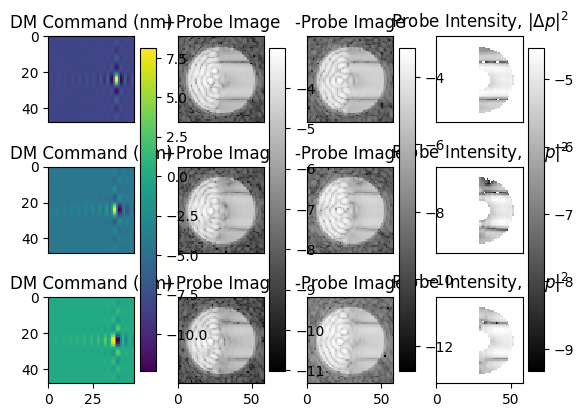

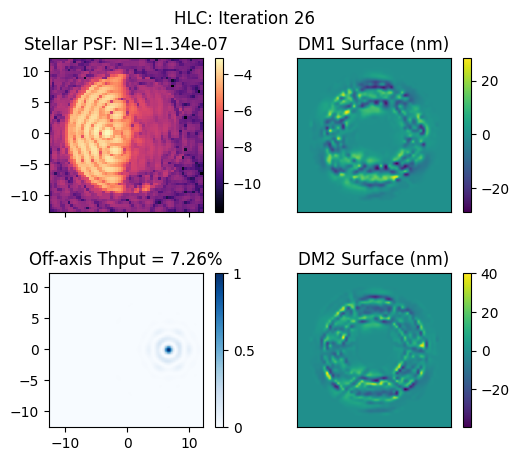

Complex projection of deltaE is 26.04    for subband 0/0
Complex correlation of deltaE is 0.48    for subband 0/0
Using the Jacobian to make other matrices...done.
Control beginning ...
Scaling factor:		0.50		0.50		0.50		0.50		0.50		0.50		0.50		0.50		
log10reg:    		-6.0		-5.5		-5.0		-4.5		-4.0		-3.5		-3.0		-2.5		
Inorm:       		1.23e-04	1.70e-05	2.30e-06	1.09e-06	8.72e-07	8.20e-07	8.19e-07	8.28e-07	
Model-based grid search expects log10reg, = -3.0,	 dmfac = 0.50,	 8.19e-07 normalized intensity.
 DM1 P-V in volts: 49.762
 DM2 P-V in volts: 79.055
RMS surface of DM1 = 6.5 nm
RMS surface of DM2 = 7.9 nm
Previous Measured NI:			 1.34e-07 
Saving data snippet to:
	/home/u21/kianmilani/Documents/falco-python/data/brief/hlc_575_test_snippet.pkl  ...done.

Iteration: 27 / 29
Zernike modes (Noll indexing) used in this Jacobian:	[1]
DMs to be used in this iteration = [ 1 2 ]


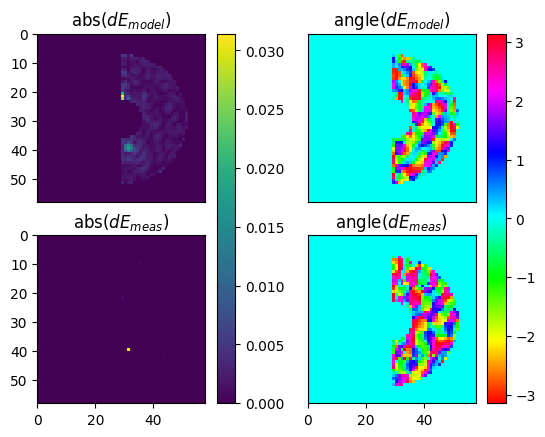

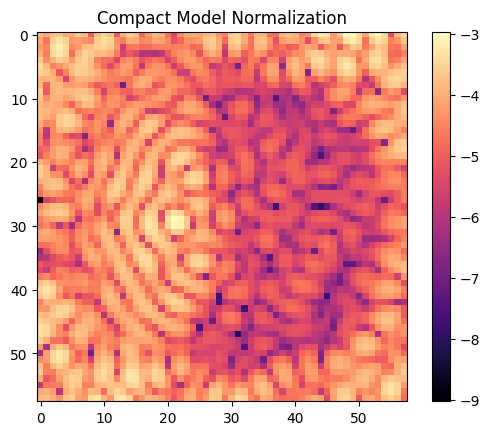

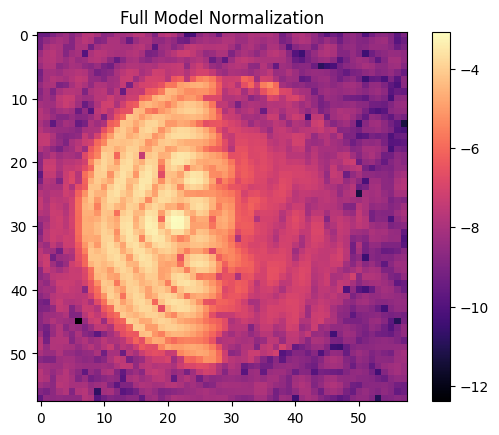

Core throughput within the half-max isophote(s) = 7.20% 	at separation = (-7.0, 0.0) lambda0/D.
Estimating electric field with batch process estimation ...
Wavelength: 0/0 ... 
Mode: 0/0 ... 
Measured unprobed Inorm (Corr / Score): 1.56e-07 	1.56e-07
Chosen probe intensity: 1.13e-05
Actual Probe 0+ Contrast is: 1.71e-05
Actual Probe 0- Contrast is: 1.73e-05
Actual Probe 1+ Contrast is: 1.40e-05
Actual Probe 1- Contrast is: 1.43e-05
Actual Probe 2+ Contrast is: 1.14e-05
Actual Probe 2- Contrast is: 1.19e-05
*** Mean measured Inorm for probe #0  =	1.706e-05
*** Mean measured Inorm for probe #1  =	1.400e-05
*** Mean measured Inorm for probe #2  =	1.153e-05
12 of 730 pixels were given zero probe amplitude.
Completed pairwise probing estimation.


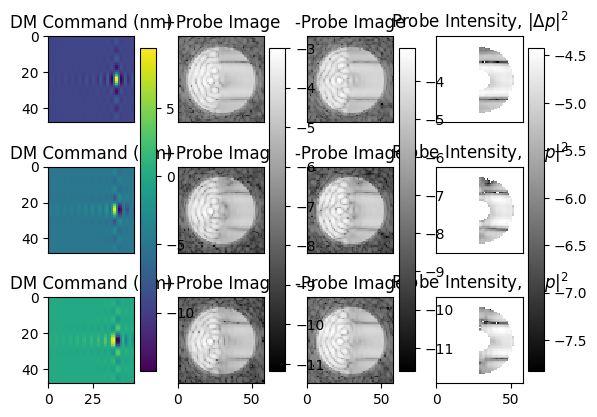

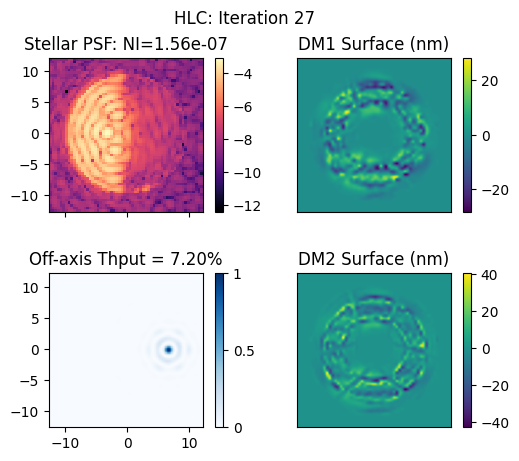

Complex projection of deltaE is 2.76    for subband 0/0
Complex correlation of deltaE is 0.72    for subband 0/0
Using the Jacobian to make other matrices...done.
Control beginning ...
Scaling factor:		0.50		0.50		0.50		0.50		0.50		0.50		0.50		0.50		
log10reg:    		-6.0		-5.5		-5.0		-4.5		-4.0		-3.5		-3.0		-2.5		
Inorm:       		1.18e-04	2.52e-05	3.02e-06	8.94e-07	4.92e-07	4.25e-07	4.14e-07	4.15e-07	
Model-based grid search expects log10reg, = -3.0,	 dmfac = 0.50,	 4.14e-07 normalized intensity.
 DM1 P-V in volts: 51.684
 DM2 P-V in volts: 82.826
RMS surface of DM1 = 6.6 nm
RMS surface of DM2 = 8.0 nm
Previous Measured NI:			 1.56e-07 
Saving data snippet to:
	/home/u21/kianmilani/Documents/falco-python/data/brief/hlc_575_test_snippet.pkl  ...done.

Iteration: 28 / 29
Zernike modes (Noll indexing) used in this Jacobian:	[1]
DMs to be used in this iteration = [ 1 2 ]


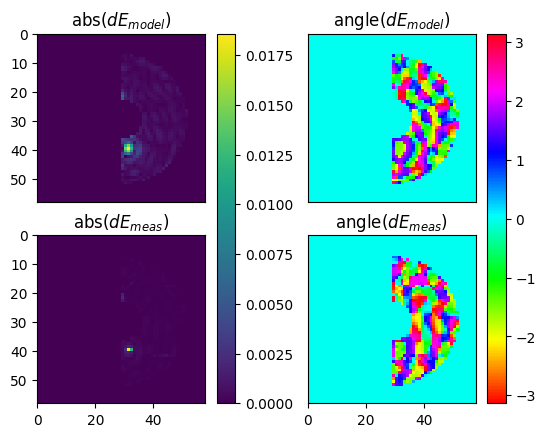

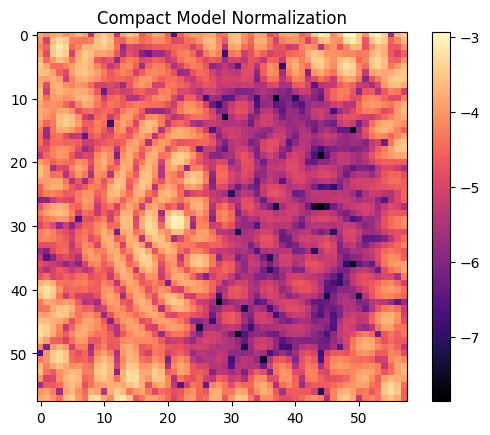

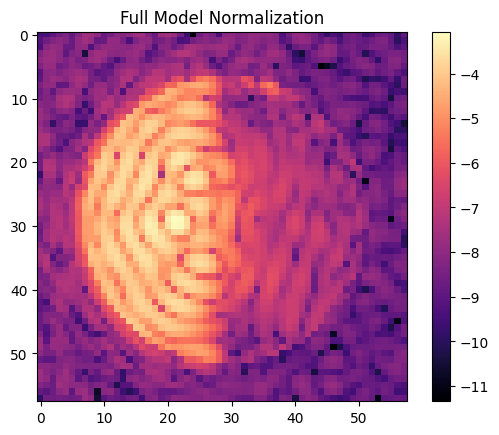

Core throughput within the half-max isophote(s) = 7.19% 	at separation = (-7.0, 0.0) lambda0/D.
Estimating electric field with batch process estimation ...
Wavelength: 0/0 ... 
Mode: 0/0 ... 
Measured unprobed Inorm (Corr / Score): 2.25e-07 	2.37e-07
Chosen probe intensity: 1.44e-05
Actual Probe 0+ Contrast is: 2.19e-05
Actual Probe 0- Contrast is: 2.21e-05
Actual Probe 1+ Contrast is: 1.79e-05
Actual Probe 1- Contrast is: 1.84e-05
Actual Probe 2+ Contrast is: 1.45e-05
Actual Probe 2- Contrast is: 1.54e-05
*** Mean measured Inorm for probe #0  =	2.177e-05
*** Mean measured Inorm for probe #1  =	1.793e-05
*** Mean measured Inorm for probe #2  =	1.475e-05
12 of 730 pixels were given zero probe amplitude.
Completed pairwise probing estimation.


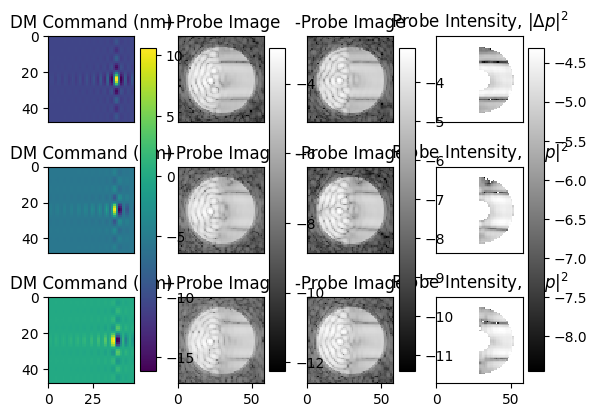

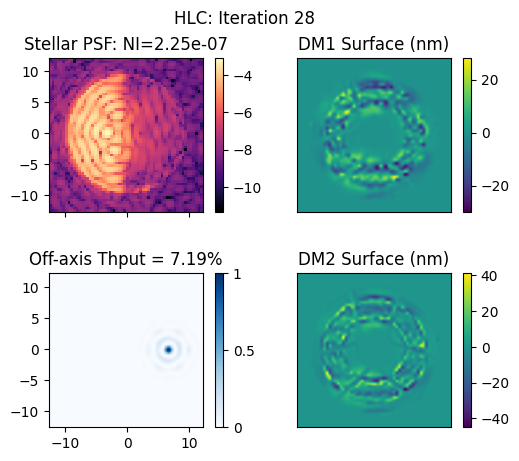

Complex projection of deltaE is 2.85    for subband 0/0
Complex correlation of deltaE is 0.26    for subband 0/0
Using the Jacobian to make other matrices...done.
Control beginning ...
Scaling factor:		0.50		0.50		0.50		0.50		0.50		0.50		0.50		0.50		
log10reg:    		-6.0		-5.5		-5.0		-4.5		-4.0		-3.5		-3.0		-2.5		
Inorm:       		1.12e-03	3.98e-04	6.00e-05	8.33e-06	3.76e-06	3.17e-06	3.09e-06	3.09e-06	
Model-based grid search expects log10reg, = -2.5,	 dmfac = 0.50,	 3.09e-06 normalized intensity.
 DM1 P-V in volts: 54.347
 DM2 P-V in volts: 74.797
RMS surface of DM1 = 6.6 nm
RMS surface of DM2 = 7.9 nm
Previous Measured NI:			 2.25e-07 
Saving data snippet to:
	/home/u21/kianmilani/Documents/falco-python/data/brief/hlc_575_test_snippet.pkl  ...done.

Iteration: 29 / 29
Zernike modes (Noll indexing) used in this Jacobian:	[1]
DMs to be used in this iteration = [ 1 2 ]


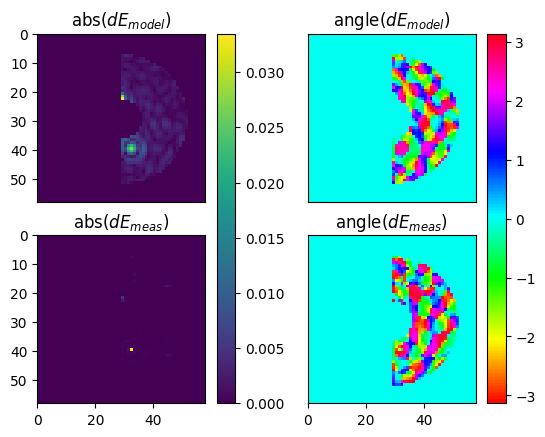

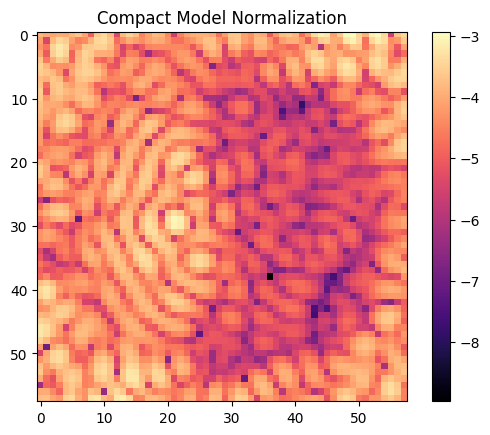

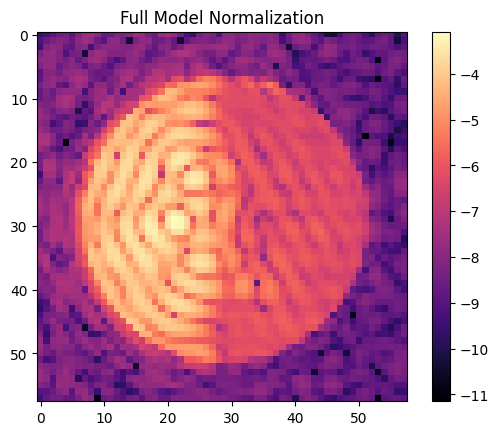

Core throughput within the half-max isophote(s) = 7.19% 	at separation = (-7.0, 0.0) lambda0/D.
Estimating electric field with batch process estimation ...
Wavelength: 0/0 ... 
Mode: 0/0 ... 
Measured unprobed Inorm (Corr / Score): 9.69e-07 	1.04e-06
Chosen probe intensity: 1.65e-05
Actual Probe 0+ Contrast is: 2.58e-05
Actual Probe 0- Contrast is: 2.58e-05
Actual Probe 1+ Contrast is: 2.14e-05
Actual Probe 1- Contrast is: 2.18e-05
Actual Probe 2+ Contrast is: 1.74e-05
Actual Probe 2- Contrast is: 1.86e-05
*** Mean measured Inorm for probe #0  =	2.484e-05
*** Mean measured Inorm for probe #1  =	2.063e-05
*** Mean measured Inorm for probe #2  =	1.705e-05
28 of 730 pixels were given zero probe amplitude.
Completed pairwise probing estimation.


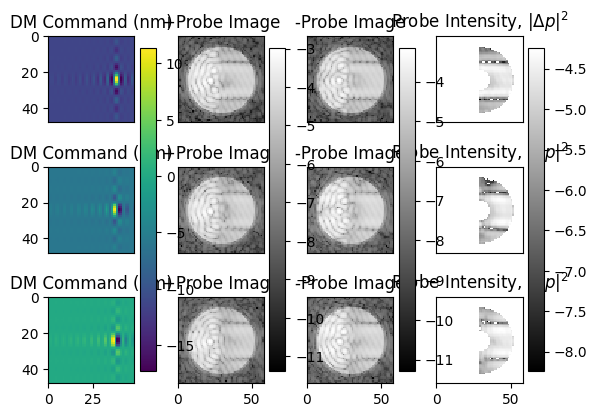

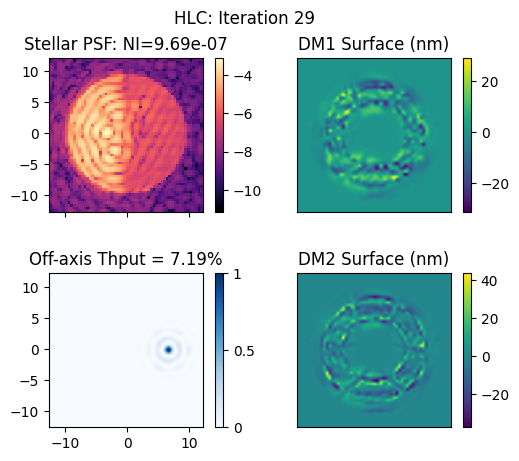

Complex projection of deltaE is 1.14    for subband 0/0
Complex correlation of deltaE is 0.58    for subband 0/0
Using the Jacobian to make other matrices...done.
Control beginning ...
Scaling factor:		0.50		0.50		0.50		0.50		0.50		0.50		0.50		0.50		
log10reg:    		-6.0		-5.5		-5.0		-4.5		-4.0		-3.5		-3.0		-2.5		
Inorm:       		1.02e-03	3.26e-04	3.97e-05	6.11e-06	2.51e-06	1.96e-06	1.84e-06	1.80e-06	
Model-based grid search expects log10reg, = -2.5,	 dmfac = 0.50,	 1.80e-06 normalized intensity.
 DM1 P-V in volts: 59.913
 DM2 P-V in volts: 76.460
RMS surface of DM1 = 6.7 nm
RMS surface of DM2 = 8.0 nm
Previous Measured NI:			 9.69e-07 
Saving data snippet to:
	/home/u21/kianmilani/Documents/falco-python/data/brief/hlc_575_test_snippet.pkl  ...done.

Core throughput within the half-max isophote(s) = 7.23% 	at separation = (-7.0, 0.0) lambda0/D.

Saving data snippet to:
	/home/u21/kianmilani/Documents/falco-python/data/brief/hlc_575_test_snippet.pkl...done.

Entire workspace NOT saved bec

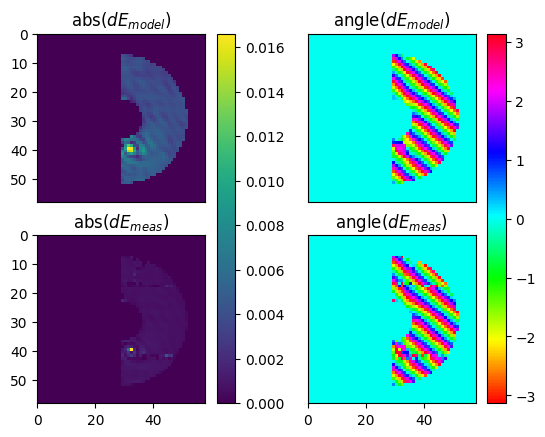

In [12]:
falco.wfsc.loop(mp, out)
misc.save_pickle('results/' + mp.runLabel + f'_mp_{date}.pkl', mp)
misc.save_pickle('results/' + mp.runLabel + f'_out_{date}.pkl', out)